# 0.a. Import and settings

In [1]:
%load_ext autoreload
%autoreload 2
%load_ext rpy2.ipython

In [2]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import rcParams
import scanpy as sc
from scanpy.plotting._tools.scatterplots import plot_scatter
import scanpy_scripts as ss
import bbknn

expr_cmap = ss.lib.expression_colormap(background_level=0.01)
doublet_cmap = ss.lib.expression_colormap(0.2)
np.set_printoptions(linewidth=180)
sc.settings.verbosity = 1
sc.settings.figdir = 'png'

In [3]:
import warnings
warnings.filterwarnings(action='ignore')
warnings.simplefilter(action='ignore', category=FutureWarning)

# 0.b. Define functions

In [17]:
def diffexp(
    adata, basis='umap', key=None, res=None, method='logreg',
    filter_params={'min_in_group_fraction': 0.4, 'max_out_group_fraction': 0.2, 'min_fold_change': 2},
    extra_genes=None, **kwargs
):
    if key:
        grp_key = f'{key}_r{str(res).replace(".", "_")}'
        basis=f'{basis}_{key}'
    else:
        grp_key = f'r{str(res).replace(".", "_")}'
    de_tbl = ss.lib.diffexp(
        adata, key_added=grp_key, groupby=f'leiden_{grp_key}', method=method,
        filter_params=filter_params, **kwargs,
    )
    de_genes = list(de_tbl.groupby('cluster').head(4)['genes'].values)
    if extra_genes:
        de_genes.extend(extra_genes)
    rcParams.update({'figure.figsize': (4,4)})
    sc.pl.rank_genes_groups(adata, key=f'rank_genes_groups_{grp_key}', show=False)

    sc.pl.dotplot(
        adata,
        var_names=de_genes,
        groupby=f'leiden_{grp_key}',
        #standard_scale='var',
        show=False
    )

    rcParams.update({'figure.figsize':(2.5,2.5)})
    plot_scatter(
        adata, basis=basis, color_map=expr_cmap, use_raw=True, ncols=8, size=10, color=de_genes, show=False)
    rcParams.update({'figure.figsize':(3,3)})
    ss.lib.plot_embedding(adata, basis=basis, groupby=f'leiden_{grp_key}', size=20, show=False)
    return de_tbl

In [4]:
def hex2rgba(hex_colors):
    return [tuple(int(h[i:i+2], 16)/255.0 for i in (1, 3, 5)) for h in hex_colors]

In [5]:
def check_doublets(
    ad, groupby, basis=None, p='bh_doublet_pval', score='scrublet_score', label='doublet', initial_pmin=0.05,
    upper_mad_only=(True, True), **kwargs
):
    if groupby not in ad.obs.columns:
        raise KeyError(f'{groupby} not found in `.obs`')
    ad.obs[label] = ad.obs[p] < initial_pmin
    doublet_freqs = ad.obs.groupby(groupby)[label].agg(lambda x: sum(x)/len(x))
    z_freq, p_freq, p_freq_adj = ss.lib.test_outlier(doublet_freqs, upper_mad_only=upper_mad_only)
    doublet_scores = ad.obs.groupby(groupby)[score].agg(lambda x: sum(x)/len(x))
    z_score, p_score, p_score_adj = ss.lib.test_outlier(doublet_scores, upper_mad_only=upper_mad_only)

    thresholds = {'min_score': max(doublet_scores)/2, 'min_freq': max(doublet_freqs)/2, 'max_p_score': 0.05, 'max_p_freq': 0.05}
    for k in thresholds:
        if k in kwargs:
            thresholds[k] = kwargs[k]
            del kwargs[k]

    if basis and f'X_{basis}' in ad.obsm.keys():
        ss.lib.set_figsize((3.5, 3.5))
        plot_scatter(ad, basis=basis, color=[score, label, groupby], color_map=doublet_cmap, legend_loc='on data', legend_fontsize=8, **kwargs)

    ss.lib.set_figsize((7,3))
    sc.pl.violin(ad, keys=[p, score], groupby=groupby)
    colors = hex2rgba(ad.uns[f'{groupby}_colors'])
    df = pd.DataFrame({'score': doublet_scores, 'p_score': p_score, 'freq': doublet_freqs, 'p_freq': p_freq})
    fig, ax = plt.subplots(ncols=2)
    df.plot(kind='scatter', x='p_score', y='p_freq', c=colors, ax=ax[0])
    ax[0].set_xlim((-0.02, 0.5))
    ax[0].set_ylim((-0.02, 0.5))
    ax[0].hlines(thresholds['max_p_freq'], xmin=0, xmax=1, linestyle='--', linewidth=1)
    ax[0].vlines(thresholds['max_p_score'], ymin=0, ymax=1, linestyle='--', linewidth=1)
    df.plot(kind='scatter', x='score', y='freq', c=colors, ax=ax[1])
#     ax[1].set_xlim((-1, 10))
    ax[1].set_ylim((-0.02, 0.5))
    ax[1].hlines(thresholds['min_freq'], xmin=min(doublet_scores), xmax=max(doublet_scores), linestyle='--', linewidth=1)
    ax[1].vlines(thresholds['min_score'], ymin=0, ymax=1, linestyle='--', linewidth=1)
    for i in range(len(p_freq)):
        ax[0].annotate(i, xy=(df.p_score[i], df.p_freq[i]))
        ax[1].annotate(i, xy=(df.score[i], df.freq[i]))
    ss.lib.set_figsize((3.5, 3.5))
    return df

In [7]:
def update_diffexp(
    ad, basis='umap', key=None, res=None,
    filter_params={'min_in_group_fraction': 0.4, 'max_out_group_fraction': 0.2, 'min_fold_change': 2},
    extra_genes=None,
):
    if key:
        grp_key = f'{key}_r{str(res).replace(".", "_")}'
        basis=f'{basis}_{key}'
    else:
        grp_key = f'r{str(res).replace(".", "_")}'
    de_key = f'rank_genes_groups_{grp_key}'
    if filter_params:
        sc.tl.filter_rank_genes_groups(
            ad,
            key=de_key,
            key_added=de_key + '_filtered',
            use_raw=True,
            **filter_params,
        )
    de_tbl = ss.lib.extract_de_table(ad.uns[de_key + '_filtered'])
    de_tbl = de_tbl.loc[de_tbl.genes.astype(str) != 'nan', :]

    de_genes = list(de_tbl.groupby('cluster').head(4)['genes'].values)
    if extra_genes:
        de_genes.extend(extra_genes)
    rcParams.update({'figure.figsize': (4,4)})
    sc.pl.rank_genes_groups(ad, key=f'rank_genes_groups_{grp_key}', show=False)

    sc.pl.dotplot(
        ad,
        var_names=de_genes,
        groupby=f'leiden_{grp_key}',
        #standard_scale='var',
        show=False
    )

    rcParams.update({'figure.figsize':(2.5,2.5)})
    plot_scatter(
        ad, basis=basis, color_map=expr_cmap, use_raw=True, ncols=8, size=10, color=de_genes, show=False)
    rcParams.update({'figure.figsize':(3,3)})
    ss.lib.plot_embedding(ad, basis=basis, groupby=f'leiden_{grp_key}', size=20, show=False)
    return de_tbl

# 1. Load data

In [97]:
CATEGORY_NAME = 'keratinocytes'
CATEGORY_CLUSTER_ID = 6
MIN_BATCH_SIZE = 10
DE_METHOD = 't-test_overestim_var'
DE_FILTERS = {'min_in_group_fraction': 0.4, 'max_out_group_fraction': 0.2, 'min_fold_change': 1.5}
KNOWN_MARKERS = ['KRT4', 'KRT1', 'KRT15', 'KRT85']
CLUSTER_RESOLUTIONS = [0.1, 0.2, 0.3, 0.4, 0.5]

In [359]:
fetal_ad = sc.read('data/h5ad/fetal_skin_raw.h5ad', mode='r')

In [6]:
fetal_ad.obs.head()

,bh_doublet_pval,cell_caller,cluster_scrublet_score,doublet_pval,mt_prop,n_counts,n_genes,sanger_id,scrublet_score,chemistry,donor,gender,pcw,sorting,sample,chemistry_sorting
index,,,,,,,,,,,,,,,,
AAACCTGCACTCTGTC-1-4834STDY7002879,0.907861,Empt,0.164557,0.455284,0.202597,385.0,239,4834STDY7002879,0.105590,SC3Pv2,F16,male,8,CD45P,F16_male_8+1PCW,SC3Pv2_CD45P
AAACCTGGTCAGTGGA-1-4834STDY7002879,0.907861,Both,0.157082,0.500000,0.062532,5917.0,1776,4834STDY7002879,0.225806,SC3Pv2,F16,male,8,CD45P,F16_male_8+1PCW,SC3Pv2_CD45P
AAAGATGGTCGATTGT-1-4834STDY7002879,0.907861,Both,0.157082,0.500000,0.030894,10261.0,2750,4834STDY7002879,0.149606,SC3Pv2,F16,male,8,CD45P,F16_male_8+1PCW,SC3Pv2_CD45P
AAAGCAAAGATGTGGC-1-4834STDY7002879,0.882352,Both,0.225806,0.150885,0.012647,7749.0,2308,4834STDY7002879,0.201970,SC3Pv2,F16,male,8,CD45P,F16_male_8+1PCW,SC3Pv2_CD45P
AAAGCAACAAGCCGTC-1-4834STDY7002879,0.907861,Empt,0.164557,0.455284,0.197686,1037.0,606,4834STDY7002879,0.225806,SC3Pv2,F16,male,8,CD45P,F16_male_8+1PCW,SC3Pv2_CD45P


In [360]:
spleen_samples = ['F69-GEX_1_SPL_45P', 'F69-GEX_2_SPL_45N', 'F69-GEX_3_SPL_45N']

In [361]:
fetal_ad = fetal_ad[~fetal_ad.obs['sample'].isin(spleen_samples), :]

In [9]:
fetal_ad

View of AnnData object with n_obs × n_vars = 235201 × 33694 
    obs: 'bh_doublet_pval', 'cell_caller', 'cluster_scrublet_score', 'doublet_pval', 'mt_prop', 'n_counts', 'n_genes', 'sanger_id', 'scrublet_score', 'chemistry', 'donor', 'gender', 'pcw', 'sorting', 'sample', 'chemistry_sorting'
    var: 'gene_ids'

In [362]:
g1_s = pd.read_csv('data/misc/G1-S_genes.list', header=None, names=['gene'])
g2_m = pd.read_csv('data/misc/G2-M_genes.list', header=None, names=['gene'])
jp_cc = pd.read_csv('data/misc/JP_cycle_genes.list', header=None, names=['gene'])

In [363]:
cc_genes = list(pd.concat([g1_s, g2_m, jp_cc]).gene.values)

In [364]:
fetal_ad.var['cc'] = fetal_ad.var_names.isin(cc_genes)

In [365]:
annot = pd.read_csv('fetal_annotation_rachel-201904.txt', sep='\t', header=None, names=['index', 'annot'], index_col=0)

In [366]:
fetal_ad.obs['annot'] = fetal_ad.obs.merge(annot, how='left', left_index=True, right_index=True)['annot']

In [367]:
fetal_ad.obs['doublet'] = fetal_ad.obs['bh_doublet_pval'] < 0.1

In [368]:
hierarchy1 = pd.read_csv('hierarchy1.txt', sep='\t', index_col=0)

In [369]:
fetal_ad.obs = fetal_ad.obs.merge(hierarchy1, how='left', left_index=True, right_index=True)

In [377]:
ad = fetal_ad[(fetal_ad.obs['hierarchy1'] == 6), :]

In [378]:
ad.obs['sample'].value_counts()

F71-GEX_5_SKI_45en    764
F51_SK_CD45N_1        315
F51_SK_CD45N_2        278
F71-GEX_4_SKI_45N     239
F71-GEX_3_SKI_45N     202
F50_SK_CD45N_1        184
F50_SK_CD45N_2        162
F32_female_7+6PCW     150
F34_female_8+1PCW     124
F33_female_9+5PCW      85
F41_female_16PCW       74
F69-GEX_7_SKI_45en     46
F45_female_13+6PCW     40
F17_male_9+1PCW        40
F51_SK_CD45P_5         36
F50_SK_CD45P_5         28
F51_SK_CD45P_6         26
F19_female_10+2PCW     20
F69-GEX_5_SKI_45N      19
F35_female_7+6PCW      18
F50_SK_CD45P_6         18
F69-GEX_6_SKI_45N      16
F71-GEX_1_SKI_45P      16
F38_male_12PCW         14
F61_SK_CD45N_2         13
F71-GEX_2_SKI_45P      12
F61_SK_CD45N_1         12
F16_male_8+1PCW        11
F69-GEX_4_SKI_45P       2
F61_SK_CD45P_1          1
Name: sample, dtype: int64

In [379]:
sample_sizes = ad.obs['sample'].value_counts()

In [380]:
valid_batches = sample_sizes[sample_sizes >= 10].index.to_list()

In [381]:
ad = ad[ad.obs['sample'].isin(valid_batches), :]

In [382]:
ad

View of AnnData object with n_obs × n_vars = 2962 × 33694 
    obs: 'bh_doublet_pval', 'cell_caller', 'cluster_scrublet_score', 'doublet_pval', 'mt_prop', 'n_counts', 'n_genes', 'sanger_id', 'scrublet_score', 'chemistry', 'donor', 'gender', 'pcw', 'sorting', 'sample', 'chemistry_sorting', 'annot', 'doublet', 'hierarchy1'
    var: 'gene_ids', 'cc'

In [383]:
ad.write('data/h5ad/fetal_skin_hierarch1_keratinocytes.h5ad', compression='gzip')

... storing 'annot' as categorical


# 2. QC

In [30]:
ad = sc.read('data/h5ad/fetal_skin_hierarch1_keratinocytes.h5ad')

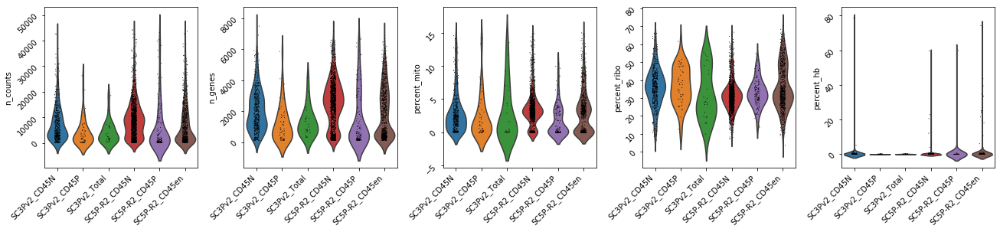

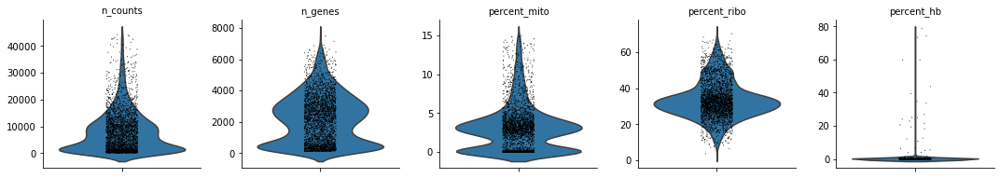

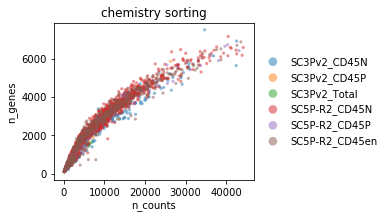

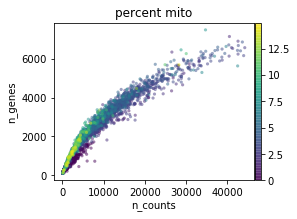

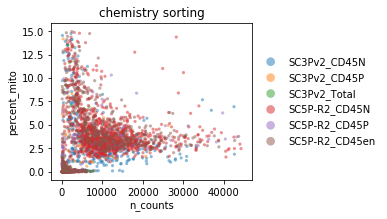

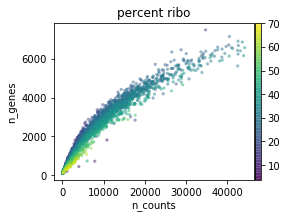

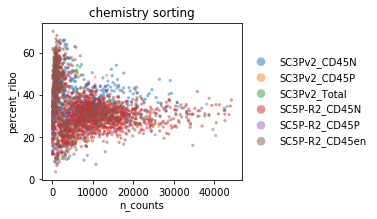

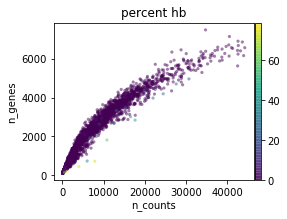

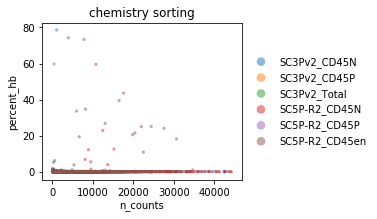

AnnData object with n_obs × n_vars = 2962 × 33694 
    obs: 'bh_doublet_pval', 'cell_caller', 'cluster_scrublet_score', 'doublet_pval', 'mt_prop', 'n_counts', 'n_genes', 'sanger_id', 'scrublet_score', 'chemistry', 'donor', 'gender', 'pcw', 'sorting', 'sample', 'chemistry_sorting', 'annot', 'doublet', 'hierarchy1', 'percent_mito', 'percent_ribo', 'percent_hb'
    var: 'gene_ids', 'cc', 'mito', 'ribo', 'hb', 'n_cells'
    uns: 'chemistry_sorting_colors'

In [31]:
rcParams.update({'figure.figsize': (4,4)})
ss.lib.simple_default_pipeline(ad, qc_only=True, batch='chemistry_sorting')

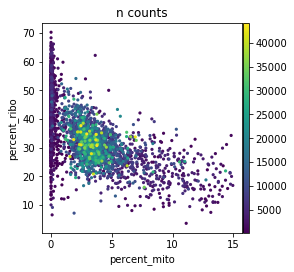

In [32]:
rcParams.update({'figure.figsize': (4,4)})
sc.pl.scatter(ad, x='percent_mito', y='percent_ribo', color='n_counts')

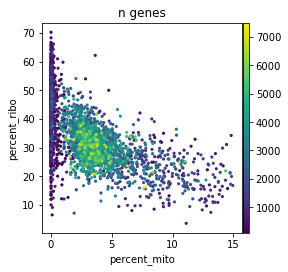

In [33]:
sc.pl.scatter(ad, x='percent_mito', y='percent_ribo', color='n_genes')

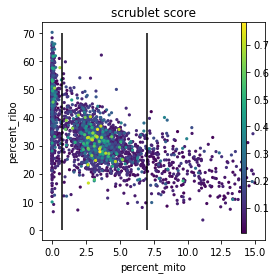

In [34]:
fig, ax = plt.subplots()
sc.pl.scatter(ad, x='percent_mito', y='percent_ribo', color='scrublet_score', ax=ax, show=False)
ax.vlines(x=[0.75, 7.0], ymin=0, ymax=70)

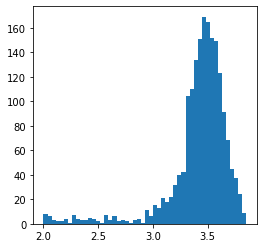

In [35]:
_ = plt.hist(np.log10(ad.obs.loc[(ad.obs.percent_mito>0.75)&(ad.obs.percent_mito<=7),'n_genes']), bins=50)

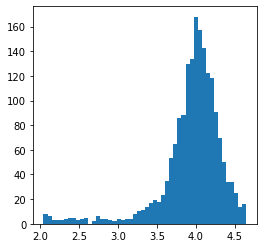

In [36]:
_ = plt.hist(np.log10(ad.obs.loc[(ad.obs.percent_mito>0.75)&(ad.obs.percent_mito<=7),'n_counts']), bins=50)

# 3. Default preprocessing

In [37]:
ad = ad[
    (ad.obs.percent_mito>=0.75) &
    (ad.obs.percent_mito<7) &
    (ad.obs.n_genes>=200) &
    (ad.obs.n_counts>=1000) &
    (ad.obs.percent_hb<2.5), :]
ad = ad[:, (ad.var.n_cells>=3)]

In [41]:
ad

View of AnnData object with n_obs × n_vars = 1747 × 18718 
    obs: 'bh_doublet_pval', 'cell_caller', 'cluster_scrublet_score', 'doublet_pval', 'mt_prop', 'n_counts', 'n_genes', 'sanger_id', 'scrublet_score', 'chemistry', 'donor', 'gender', 'pcw', 'sorting', 'sample', 'chemistry_sorting', 'annot', 'doublet', 'hierarchy1', 'percent_mito', 'percent_ribo', 'percent_hb'
    var: 'gene_ids', 'cc', 'mito', 'ribo', 'hb', 'n_cells'

In [39]:
ad1 = ad.copy()[:, ~(ad.var.mito | ad.var.hb | ad.var.ribo)]
ad2 = ad.copy()[:,~(ad.var.mito | ad.var.hb | ad.var.ribo | ad.var.cc)]

In [40]:
ss.lib.simple_default_pipeline(
    ad1,
    filter_params=None,
    hvg_params={'flavor': 'seurat', 'by_batch': ['chemistry', 2]},
    scale_params={'max_value': 10},
    pca_params={'n_comps': 50, 'svd_solver': 'arpack', 'use_highly_variable': True},
    harmony_params=None,
    nb_params={'use_rep': 'X_pca', 'key_added': 'orig'},
    umap_params={'use_graph': 'neighbors_orig', 'key_added': 'orig'},
    leiden_params={'resolution': [0.1, 0.2, 0.3, 0.4], 'use_graph': 'neighbors_orig', 'key_added': 'orig'},
    tsne_params=None, diffmap_params=None, fdg_params=None,
)

AnnData object with n_obs × n_vars = 1747 × 18593 
    obs: 'bh_doublet_pval', 'cell_caller', 'cluster_scrublet_score', 'doublet_pval', 'mt_prop', 'n_counts', 'n_genes', 'sanger_id', 'scrublet_score', 'chemistry', 'donor', 'gender', 'pcw', 'sorting', 'sample', 'chemistry_sorting', 'annot', 'doublet', 'hierarchy1', 'percent_mito', 'percent_ribo', 'percent_hb', 'leiden_orig_r0_1', 'leiden_orig_r0_2', 'leiden_orig_r0_3', 'leiden_orig_r0_4'
    var: 'gene_ids', 'cc', 'mito', 'ribo', 'hb', 'n_cells', 'highly_variable'
    uns: 'pca', 'neighbors_orig', 'neighbors', 'leiden'
    obsm: 'X_pca', 'X_umap_orig'
    varm: 'PCs'

In [42]:
ss.lib.simple_default_pipeline(
    ad2,
    filter_params=None,
    hvg_params={'flavor': 'seurat', 'by_batch': ['chemistry', 2]},
    scale_params={'max_value': 10},
    pca_params={'n_comps': 50, 'svd_solver': 'arpack', 'use_highly_variable': True},
    harmony_params=None,
    nb_params={'use_rep': 'X_pca', 'key_added': 'orig'},
    umap_params={'use_graph': 'neighbors_orig', 'key_added': 'orig'},
    leiden_params={'resolution': [0.1, 0.2, 0.3, 0.4], 'use_graph': 'neighbors_orig', 'key_added': 'orig'},
    tsne_params=None, diffmap_params=None, fdg_params=None,
)

AnnData object with n_obs × n_vars = 1747 × 18031 
    obs: 'bh_doublet_pval', 'cell_caller', 'cluster_scrublet_score', 'doublet_pval', 'mt_prop', 'n_counts', 'n_genes', 'sanger_id', 'scrublet_score', 'chemistry', 'donor', 'gender', 'pcw', 'sorting', 'sample', 'chemistry_sorting', 'annot', 'doublet', 'hierarchy1', 'percent_mito', 'percent_ribo', 'percent_hb', 'leiden_orig_r0_1', 'leiden_orig_r0_2', 'leiden_orig_r0_3', 'leiden_orig_r0_4'
    var: 'gene_ids', 'cc', 'mito', 'ribo', 'hb', 'n_cells', 'highly_variable'
    uns: 'pca', 'neighbors_orig', 'neighbors', 'leiden'
    obsm: 'X_pca', 'X_umap_orig'
    varm: 'PCs'

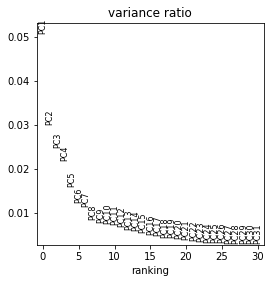

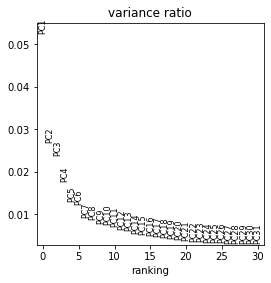

In [19]:
rcParams.update({'figure.figsize': (4,4)})
sc.pl.pca_variance_ratio(ad1, n_pcs=30)
sc.pl.pca_variance_ratio(ad2, n_pcs=30)

In [91]:
k_annot = (ad1.obs['annot'] != 'nan').values
ad1.obs['lr_annot'] = ss.lib.LR_annotate(ad1, train_label=ad1.obs['annot'].values, train_x=ad1.obsm['X_pca'],
                                        subset=k_annot, use_rep='X_pca', return_label=True)
ad1.obs['lr_annot'] = ad1.obs['lr_annot'].astype('category')

In [92]:
k_annot = (ad2.obs['annot'] != 'nan').values
ad2.obs['lr_annot'] = ss.lib.LR_annotate(ad2, train_label=ad2.obs['annot'].values, train_x=ad2.obsm['X_pca'],
                                        subset=k_annot, use_rep='X_pca', return_label=True)
ad2.obs['lr_annot'] = ad2.obs['lr_annot'].astype('category')

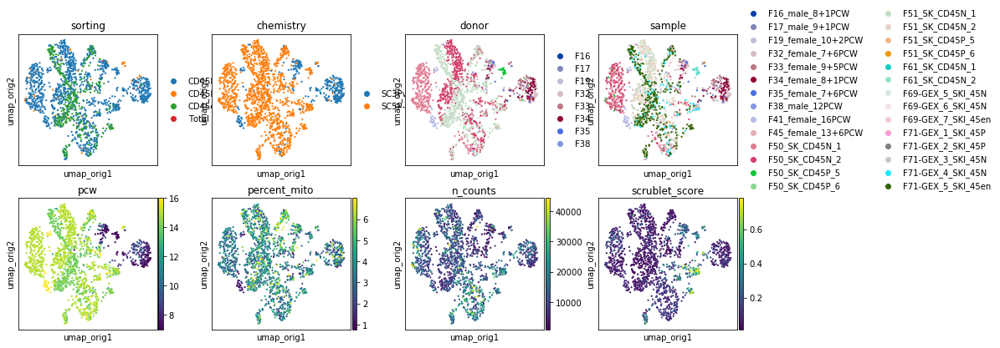

In [43]:
rcParams.update({'figure.figsize':(3,3)})
plot_scatter(ad1, basis='umap_orig',
             color=['sorting', 'chemistry', 'donor', 'sample', 'pcw', 'percent_mito', 'n_counts', 'scrublet_score'], size=20)

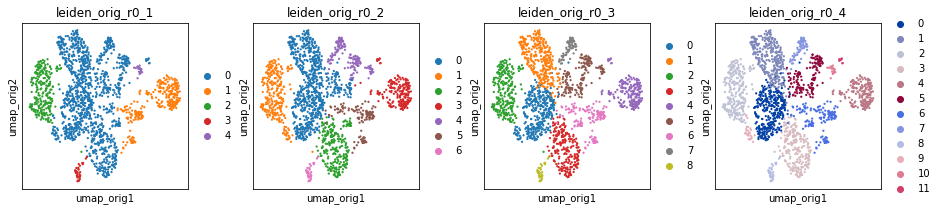

In [44]:
plot_scatter(ad1, basis='umap_orig', color_map=expr_cmap,
             color=[f'leiden_orig_r{str(res).replace(".", "_")}' for res in [0.1, 0.2, 0.3, 0.4]], size=20, ncols=4)

In [397]:
doublet_freq = ad1.obs.groupby('leiden_orig_r0_2')['doublet'].agg(lambda x: sum(x)/len(x))
_, p = ss.lib.test_outlier(doublet_freq, upper_mad_only=False)
print(pd.DataFrame({'freq': doublet_freq, 'p': p}))

                      freq     p
leiden_orig_r0_2                
0                 0.005472  0.75
1                 0.000000  0.75
2                 0.000000  0.75
3                 0.010101  0.75
4                 0.006803  0.75
5                 0.177966  0.00
6                 0.382353  0.00


In [76]:
ad1 = ad1[~ad1.obs['leiden_orig_r0_2'].isin(['5', '6']), :]

In [77]:
ad1.X = ad1.raw.X

In [78]:
ss.lib.simple_default_pipeline(
    ad1,
    filter_params=None,
    norm_params=None,
    hvg_params={'flavor': 'seurat', 'by_batch': ['chemistry', 2]},
    scale_params={'max_value': 10},
    pca_params={'n_comps': 50, 'svd_solver': 'arpack', 'use_highly_variable': True},
    harmony_params=None,
    nb_params={'use_rep': 'X_pca', 'key_added': 'orig2'},
    umap_params={'use_graph': 'neighbors_orig2', 'key_added': 'orig2'},
    leiden_params={'resolution': [0.1, 0.2, 0.3, 0.4], 'key_added': 'orig2'},
    tsne_params=None, diffmap_params=None, fdg_params=None,
)

AnnData object with n_obs × n_vars = 1595 × 18593 
    obs: 'bh_doublet_pval', 'cell_caller', 'cluster_scrublet_score', 'doublet_pval', 'mt_prop', 'n_counts', 'n_genes', 'sanger_id', 'scrublet_score', 'chemistry', 'donor', 'gender', 'pcw', 'sorting', 'sample', 'chemistry_sorting', 'annot', 'doublet', 'hierarchy1', 'percent_mito', 'percent_ribo', 'percent_hb', 'leiden_orig_r0_1', 'leiden_orig_r0_2', 'leiden_orig_r0_3', 'leiden_orig_r0_4', '__is_in_cluster__', 'leiden_orig2_r0_1', 'leiden_orig2_r0_2', 'leiden_orig2_r0_3', 'leiden_orig2_r0_4'
    var: 'gene_ids', 'cc', 'mito', 'ribo', 'hb', 'n_cells', 'highly_variable'
    uns: 'pca', 'neighbors_orig', 'leiden', 'rank_genes_groups_orig_r0_2', 'rank_genes_groups_orig_r0_2_filtered', 'leiden_orig_r0_2_colors', 'neighbors_orig2', 'neighbors'
    obsm: 'X_pca', 'X_umap_orig', 'X_umap_orig2'
    varm: 'PCs'

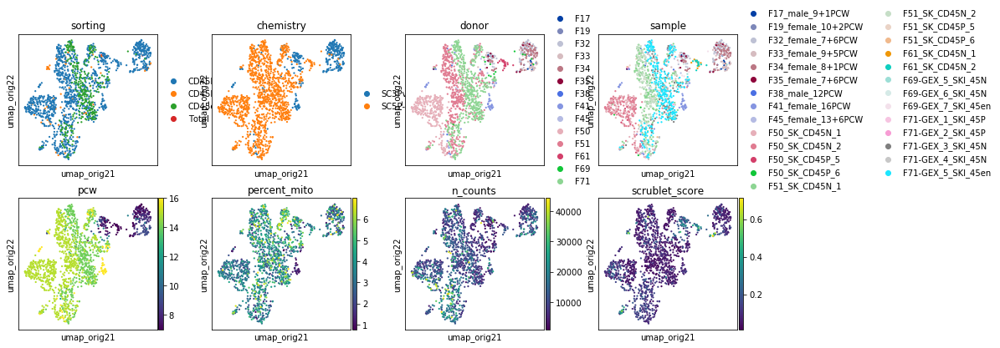

In [81]:
rcParams.update({'figure.figsize':(3,3)})
plot_scatter(ad1, basis='umap_orig2',
             color=['sorting', 'chemistry', 'donor', 'sample', 'pcw', 'percent_mito', 'n_counts', 'scrublet_score'], size=20)

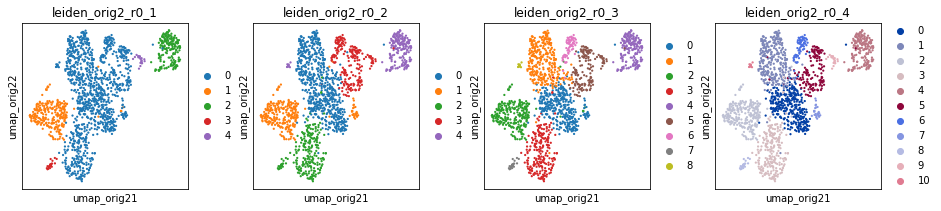

In [80]:
plot_scatter(ad1, basis='umap_orig2', color_map=expr_cmap,
             color=[f'leiden_orig2_r{str(res).replace(".", "_")}' for res in [0.1, 0.2, 0.3, 0.4]], size=20, ncols=4)

,cluster,ref,rank,genes,scores
18596,1,rest,3,HSPA6,0.224023
18597,1,rest,4,ZFAND2A,0.148401
18611,1,rest,18,CTGF,0.096545
37188,2,rest,2,UBE2C,0.187910
37190,2,rest,4,TOP2A,0.180201
37192,2,rest,6,NUSAP1,0.169580
37193,2,rest,7,CCNB2,0.163865
37194,2,rest,8,CENPF,0.159296
55779,3,rest,0,KRT4,0.136749
55781,3,rest,2,SPP1,0.104465


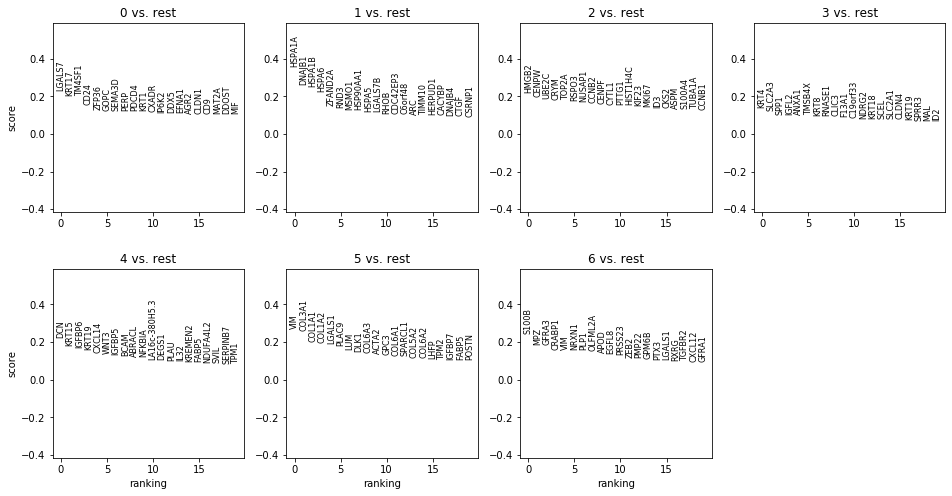

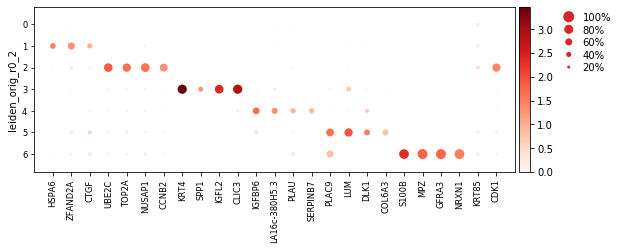

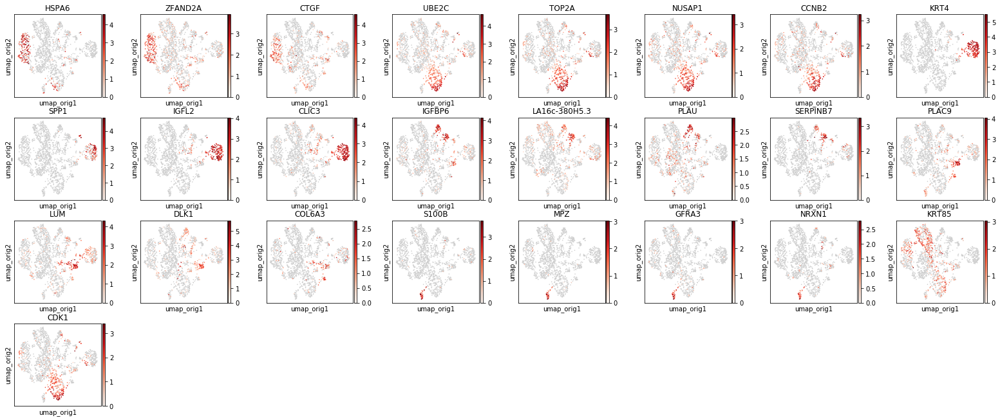

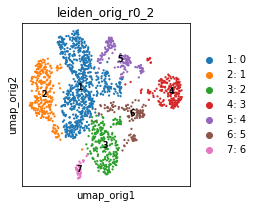

In [398]:
orig_de_genes1 = diffexp(
    ad1, basis='umap', key='orig', res=0.2,
    filter_params={'min_in_group_fraction': 0.4, 'max_out_group_fraction': 0.2, 'min_fold_change': 2},
    extra_genes=['KRT85', 'CDK1']
)
orig_de_genes1.groupby('cluster').head(5)

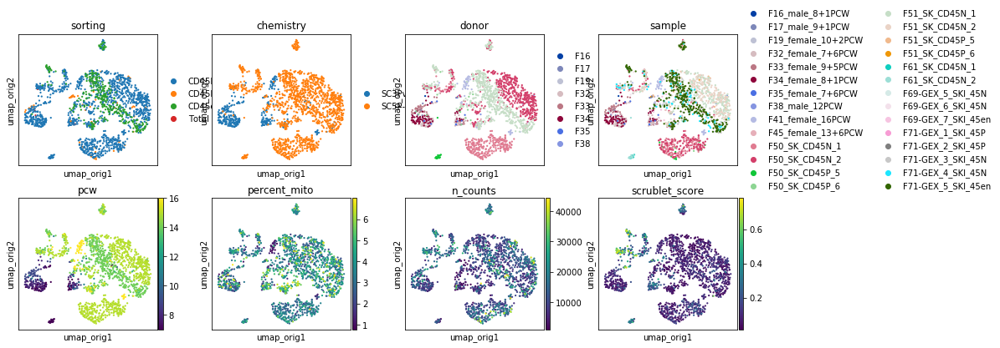

In [45]:
rcParams.update({'figure.figsize':(3,3)})
plot_scatter(ad2, basis='umap_orig',
             color=['sorting', 'chemistry', 'donor', 'sample', 'pcw', 'percent_mito', 'n_counts', 'scrublet_score'], size=20)

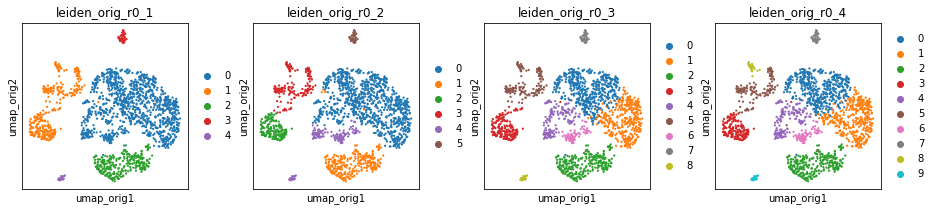

In [46]:
plot_scatter(ad2, basis='umap_orig', color_map=expr_cmap,
             color=[f'leiden_orig_r{str(res).replace(".", "_")}' for res in [0.1, 0.2, 0.3, 0.4]], size=20, ncols=4)

In [401]:
doublet_freq = ad2.obs.groupby('leiden_orig_r0_3')['doublet'].agg(lambda x: sum(x)/len(x))
_, p = ss.lib.test_outlier(doublet_freq, upper_mad_only=False)
print(pd.DataFrame({'freq': doublet_freq, 'p': p}))

                      freq         p
leiden_orig_r0_3                    
0                 0.006148  0.750000
1                 0.002778  0.750000
2                 0.000000  0.750000
3                 0.000000  0.750000
4                 0.019231  0.226736
5                 0.133333  0.000000
6                 0.014085  0.431833
7                 0.382353  0.000000
8                 0.000000  0.750000


In [92]:
ad2 = ad2[~ad2.obs['leiden_orig_r0_2'].isin(['3', '5']), :]

In [93]:
ad2.X = ad2.raw.X

In [94]:
ss.lib.simple_default_pipeline(
    ad2,
    filter_params=None,
    norm_params=None,
    hvg_params={'flavor': 'seurat', 'by_batch': ['chemistry', 2]},
    scale_params={'max_value': 10},
    pca_params={'n_comps': 50, 'svd_solver': 'arpack', 'use_highly_variable': True},
    harmony_params=None,
    nb_params={'use_rep': 'X_pca', 'key_added': 'orig2'},
    umap_params={'use_graph': 'neighbors_orig2', 'key_added': 'orig2'},
    leiden_params={'resolution': [0.1, 0.2, 0.3, 0.4], 'key_added': 'orig2'},
    tsne_params=None, diffmap_params=None, fdg_params=None,
)

AnnData object with n_obs × n_vars = 1549 × 18031 
    obs: 'bh_doublet_pval', 'cell_caller', 'cluster_scrublet_score', 'doublet_pval', 'mt_prop', 'n_counts', 'n_genes', 'sanger_id', 'scrublet_score', 'chemistry', 'donor', 'gender', 'pcw', 'sorting', 'sample', 'chemistry_sorting', 'annot', 'doublet', 'hierarchy1', 'percent_mito', 'percent_ribo', 'percent_hb', 'leiden_orig_r0_1', 'leiden_orig_r0_2', 'leiden_orig_r0_3', 'leiden_orig_r0_4', 'leiden_orig2_r0_1', 'leiden_orig2_r0_2', 'leiden_orig2_r0_3', 'leiden_orig2_r0_4'
    var: 'gene_ids', 'cc', 'mito', 'ribo', 'hb', 'n_cells', 'highly_variable'
    uns: 'pca', 'neighbors_orig', 'leiden', 'sorting_colors', 'chemistry_colors', 'donor_colors', 'sample_colors', 'leiden_orig_r0_1_colors', 'leiden_orig_r0_2_colors', 'leiden_orig_r0_3_colors', 'leiden_orig_r0_4_colors', 'neighbors_orig2', 'neighbors'
    obsm: 'X_pca', 'X_umap_orig', 'X_umap_orig2'
    varm: 'PCs'

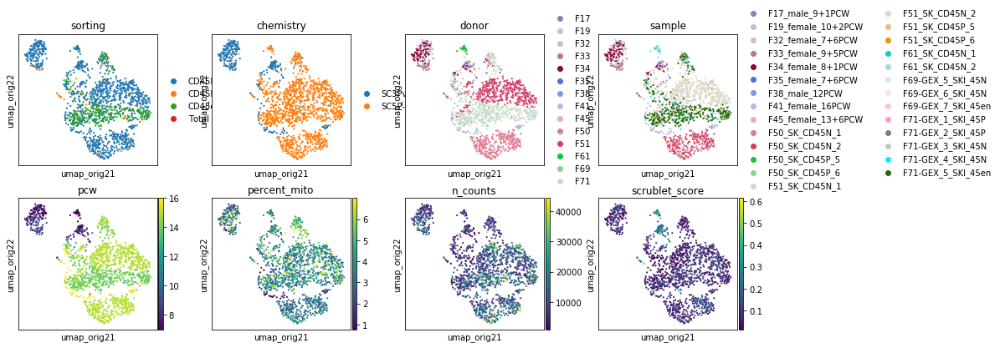

In [95]:
rcParams.update({'figure.figsize':(3,3)})
plot_scatter(ad2, basis='umap_orig2',
             color=['sorting', 'chemistry', 'donor', 'sample', 'pcw', 'percent_mito', 'n_counts', 'scrublet_score'], size=20)

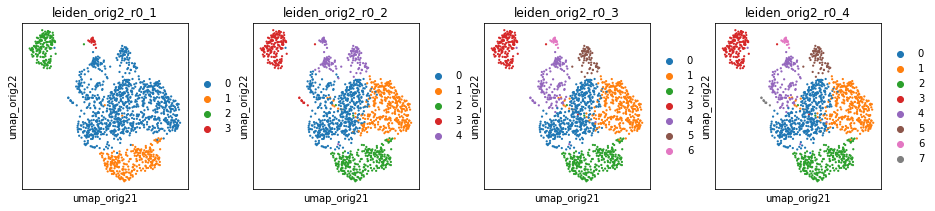

In [96]:
plot_scatter(ad2, basis='umap_orig2', color_map=expr_cmap,
             color=[f'leiden_orig2_r{str(res).replace(".", "_")}' for res in [0.1, 0.2, 0.3, 0.4]], size=20, ncols=4)

,cluster,ref,rank,genes,scores
18039,1,rest,8,SPOCK1,0.130958
18054,1,rest,23,SHH,0.096083
36065,2,rest,3,HSPA6,0.183993
36066,2,rest,4,ZFAND2A,0.174388
36074,2,rest,12,CTGF,0.120538
54093,3,rest,0,KRT4,0.152183
54096,3,rest,3,CLIC3,0.110272
54097,3,rest,4,IGFL2,0.105689
54100,3,rest,7,CLDN4,0.086288
54101,3,rest,8,SPRR3,0.084746


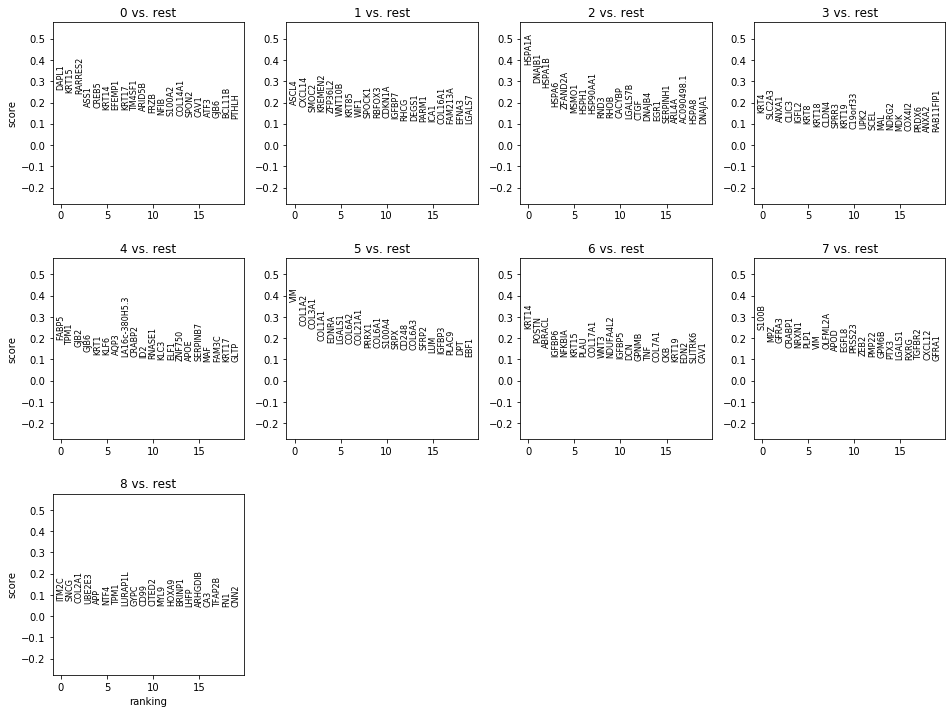

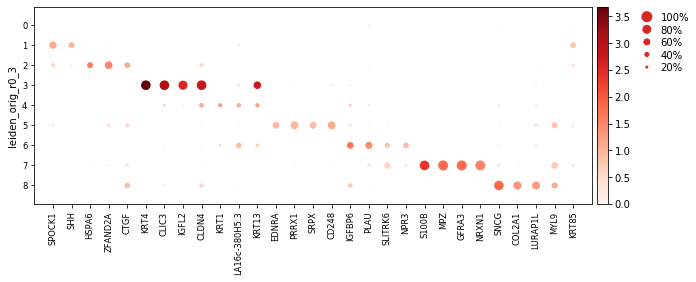

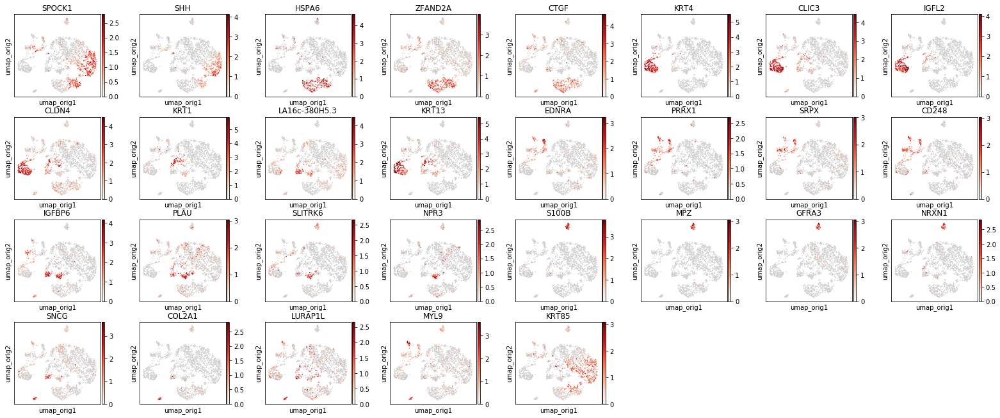

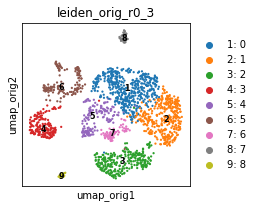

In [402]:
orig_de_genes2 = diffexp(
    ad2, basis='umap', key='orig', res=0.3,
    filter_params={'min_in_group_fraction': 0.4, 'max_out_group_fraction': 0.2, 'min_fold_change': 2},
    extra_genes=['KRT85']
)
orig_de_genes2.groupby('cluster').head(5)

# 4.1 Harmony

In [47]:
ss.lib.simple_default_pipeline(
    ad1,
    filter_params=None, norm_params=None, hvg_params=None, scale_params=None, pca_params=None,
#     harmony_params=None,
    harmony_params={'batch': 'sample'},
    nb_params={'use_rep': 'X_pca_hm', 'key_added': 'hm'},
    umap_params={'use_graph': 'neighbors_hm', 'key_added': 'hm'},
    leiden_params={'resolution': [0.1, 0.2, 0.3, 0.4], 'use_graph': 'neighbors_hm', 'key_added': 'hm'},
    tsne_params=None, diffmap_params=None, fdg_params=None,
)

AnnData object with n_obs × n_vars = 1747 × 18593 
    obs: 'bh_doublet_pval', 'cell_caller', 'cluster_scrublet_score', 'doublet_pval', 'mt_prop', 'n_counts', 'n_genes', 'sanger_id', 'scrublet_score', 'chemistry', 'donor', 'gender', 'pcw', 'sorting', 'sample', 'chemistry_sorting', 'annot', 'doublet', 'hierarchy1', 'percent_mito', 'percent_ribo', 'percent_hb', 'leiden_orig_r0_1', 'leiden_orig_r0_2', 'leiden_orig_r0_3', 'leiden_orig_r0_4', 'leiden_hm_r0_1', 'leiden_hm_r0_2', 'leiden_hm_r0_3', 'leiden_hm_r0_4'
    var: 'gene_ids', 'cc', 'mito', 'ribo', 'hb', 'n_cells', 'highly_variable'
    uns: 'pca', 'neighbors_orig', 'leiden', 'sorting_colors', 'chemistry_colors', 'donor_colors', 'sample_colors', 'leiden_orig_r0_1_colors', 'leiden_orig_r0_2_colors', 'leiden_orig_r0_3_colors', 'leiden_orig_r0_4_colors', 'neighbors_hm', 'neighbors'
    obsm: 'X_pca', 'X_umap_orig', 'X_pca_hm', 'X_umap_hm'
    varm: 'PCs'

In [48]:
ss.lib.simple_default_pipeline(
    ad2,
    filter_params=None, norm_params=None, hvg_params=None, scale_params=None, pca_params=None,
#     harmony_params=None,
    harmony_params={'batch': 'sample'},
    nb_params={'use_rep': 'X_pca_hm', 'key_added': 'hm'},
    umap_params={'use_graph': 'neighbors_hm', 'key_added': 'hm'},
    leiden_params={'resolution': [0.1, 0.2, 0.3, 0.4], 'use_graph': 'neighbors_hm', 'key_added': 'hm'},
    tsne_params=None, diffmap_params=None, fdg_params=None,
)

AnnData object with n_obs × n_vars = 1747 × 18031 
    obs: 'bh_doublet_pval', 'cell_caller', 'cluster_scrublet_score', 'doublet_pval', 'mt_prop', 'n_counts', 'n_genes', 'sanger_id', 'scrublet_score', 'chemistry', 'donor', 'gender', 'pcw', 'sorting', 'sample', 'chemistry_sorting', 'annot', 'doublet', 'hierarchy1', 'percent_mito', 'percent_ribo', 'percent_hb', 'leiden_orig_r0_1', 'leiden_orig_r0_2', 'leiden_orig_r0_3', 'leiden_orig_r0_4', 'leiden_hm_r0_1', 'leiden_hm_r0_2', 'leiden_hm_r0_3', 'leiden_hm_r0_4'
    var: 'gene_ids', 'cc', 'mito', 'ribo', 'hb', 'n_cells', 'highly_variable'
    uns: 'pca', 'neighbors_orig', 'leiden', 'sorting_colors', 'chemistry_colors', 'donor_colors', 'sample_colors', 'leiden_orig_r0_1_colors', 'leiden_orig_r0_2_colors', 'leiden_orig_r0_3_colors', 'leiden_orig_r0_4_colors', 'neighbors_hm', 'neighbors'
    obsm: 'X_pca', 'X_umap_orig', 'X_pca_hm', 'X_umap_hm'
    varm: 'PCs'

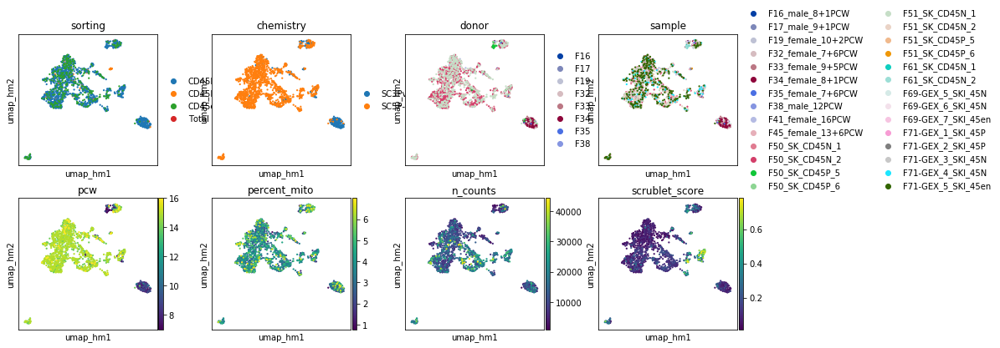

In [49]:
rcParams.update({'figure.figsize':(3,3)})
plot_scatter(ad1, basis='umap_hm',
             color=['sorting', 'chemistry', 'donor', 'sample', 'pcw', 'percent_mito', 'n_counts', 'scrublet_score'], size=20)

In [101]:
ss.lib.leiden(ad1, use_graph='neighbors_hm', key_added='hm', resolution=CLUSTER_RESOLUTIONS)

['leiden_hm_r0_1',
 'leiden_hm_r0_2',
 'leiden_hm_r0_3',
 'leiden_hm_r0_4',
 'leiden_hm_r0_5']

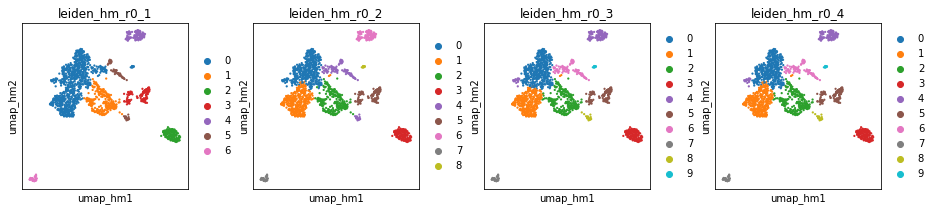

In [50]:
rcParams.update({'figure.figsize':(3,3)})
plot_scatter(ad1, basis='umap_hm', color=[f'leiden_hm_r0_{i}' for i in (1,2,3,4)], size=20)

In [51]:
doublet_freq = ad1.obs.groupby('leiden_hm_r0_2')['doublet'].agg(lambda x: sum(x)/len(x))
_, p = ss.lib.test_outlier(doublet_freq, upper_mad_only=False)
print(pd.DataFrame({'freq': doublet_freq, 'p': p}))

                    freq     p
leiden_hm_r0_2                
0               0.004016  0.75
1               0.002597  0.75
2               0.000000  0.75
3               0.000000  0.75
4               0.007042  0.75
5               0.161538  0.00
6               0.008475  0.75
7               0.382353  0.00
8               0.200000  0.00


,cluster,ref,rank,genes,scores,logfoldchanges,pvals,pvals_adj
18596,1,rest,3,SPOCK1,19.328651,3.240892,1.164105e-65,4.328839e-62
18599,1,rest,6,KCNMA1,17.827677,3.422192,2.095942e-56,3.542714e-53
18601,1,rest,8,SHH,16.918991,4.132451,7.413839e-51,8.108560e-48
18603,1,rest,10,SNCAIP,16.733849,2.903657,4.553745e-52,6.047699e-49
18609,1,rest,16,VIT,15.001243,2.902494,3.404059e-43,2.637153e-40
37187,2,rest,1,NUSAP1,30.285944,4.943249,1.419915e-105,1.320024e-101
37189,2,rest,3,TOP2A,27.399614,5.269600,1.446243e-89,4.481667e-86
37190,2,rest,4,MAD2L1,26.209660,3.834098,1.474684e-94,5.483761e-91
37191,2,rest,5,MKI67,25.850281,5.048401,9.511845e-84,2.526482e-80
37193,2,rest,7,CDK1,25.662285,5.135846,2.102529e-82,4.886541e-79


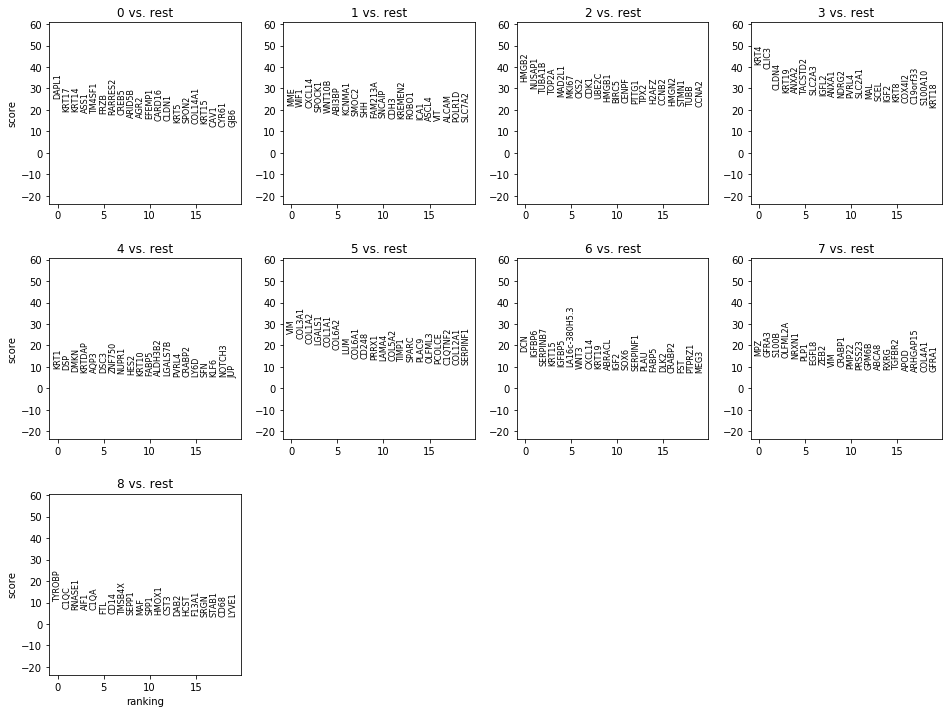

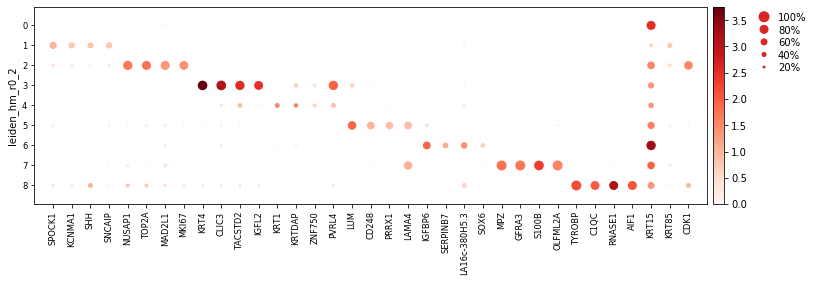

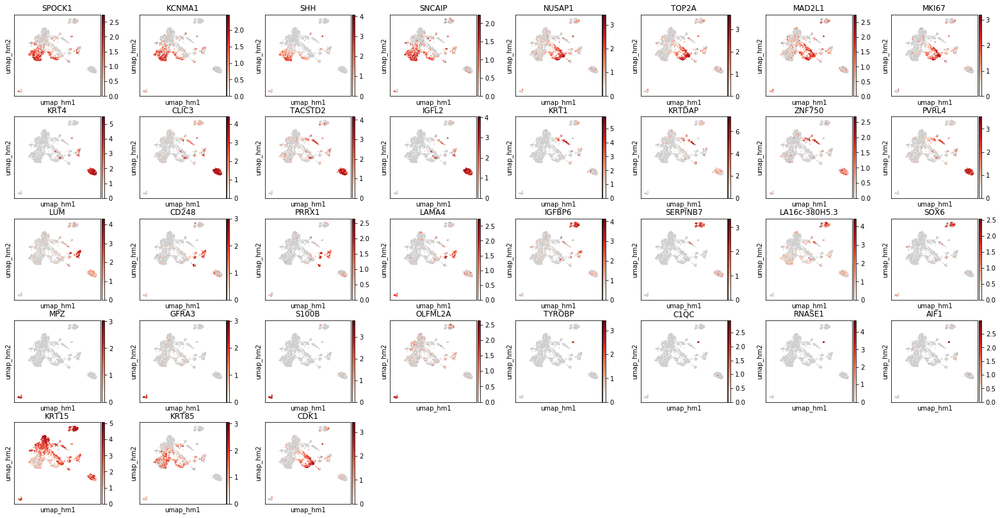

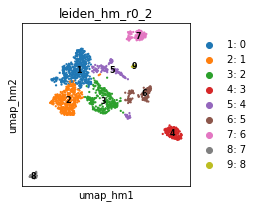

In [52]:
hm_de_genes1 = diffexp(
    ad1, basis='umap', key='hm', res=0.2, method='t-test_overestim_var',
    filter_params={'min_in_group_fraction': 0.4, 'max_out_group_fraction': 0.2, 'min_fold_change': 1.5},
    extra_genes=['KRT15', 'KRT85', 'CDK1']
)
hm_de_genes1.groupby('cluster').head(5)

In [53]:
hm_de_genes1.groupby('cluster').head(30).to_csv('2.7_keratinocytes_harmony_withCC_leiden_r0_2_DE_filtered_top30.txt', sep='\t', index=False)

In [55]:
ss.lib.extract_de_table(ad1.uns['rank_genes_groups_hm_r0_2']).groupby('cluster').head(200).to_csv(
    '2.7_keratinocytes_harmony_withCC_leiden_r0_2_DE_top200.txt', sep='\t', index=False)

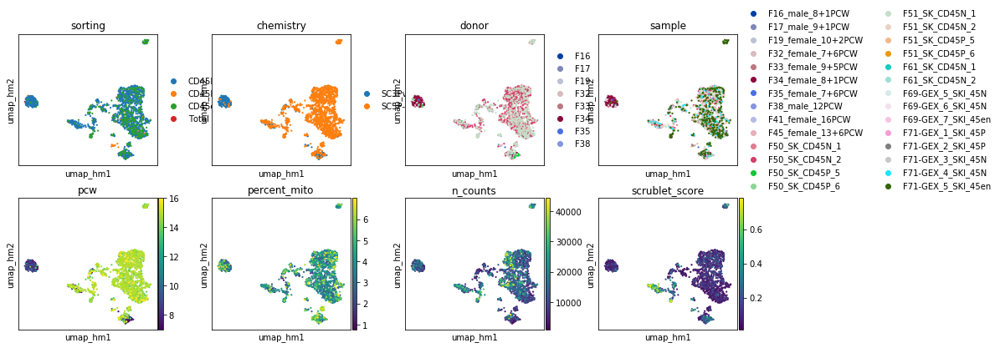

In [56]:
rcParams.update({'figure.figsize':(3,3)})
plot_scatter(ad2, basis='umap_hm',
             color=['sorting', 'chemistry', 'donor', 'sample', 'pcw', 'percent_mito', 'n_counts', 'scrublet_score'], size=20)

In [102]:
ss.lib.leiden(ad2, use_graph='neighbors_hm', key_added='hm', resolution=CLUSTER_RESOLUTIONS)

['leiden_hm_r0_1',
 'leiden_hm_r0_2',
 'leiden_hm_r0_3',
 'leiden_hm_r0_4',
 'leiden_hm_r0_5']

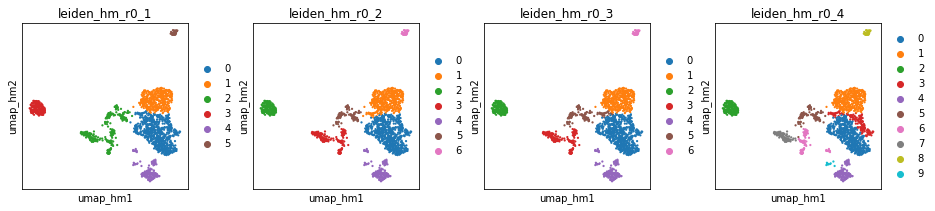

In [57]:
rcParams.update({'figure.figsize':(3,3)})
plot_scatter(ad2, basis='umap_hm', color=[f'leiden_hm_r0_{i}' for i in (1,2,3,4)], size=20)

In [58]:
doublet_freq = ad2.obs.groupby('leiden_hm_r0_2')['doublet'].agg(lambda x: sum(x)/len(x))
_, p = ss.lib.test_outlier(doublet_freq, upper_mad_only=False)
print(pd.DataFrame({'freq': doublet_freq, 'p': p}))

                    freq             p
leiden_hm_r0_2                        
0               0.003026  7.500003e-01
1               0.002288  7.500003e-01
2               0.000000  7.500003e-01
3               0.119048  7.771561e-16
4               0.024845  2.828804e-01
5               0.009091  7.500003e-01
6               0.371429  0.000000e+00


,cluster,ref,rank,genes,scores
18031,1,rest,0,SPOCK1,0.192618
18033,1,rest,2,MME,0.160866
18041,1,rest,10,LTB,0.125199
18051,1,rest,20,KCNMA1,0.102732
18054,1,rest,23,SHH,0.099301
36062,2,rest,0,KRT4,0.152070
36065,2,rest,3,CLIC3,0.111240
36067,2,rest,5,MAL,0.093711
36069,2,rest,7,CLDN4,0.083554
36071,2,rest,9,SCEL,0.079628


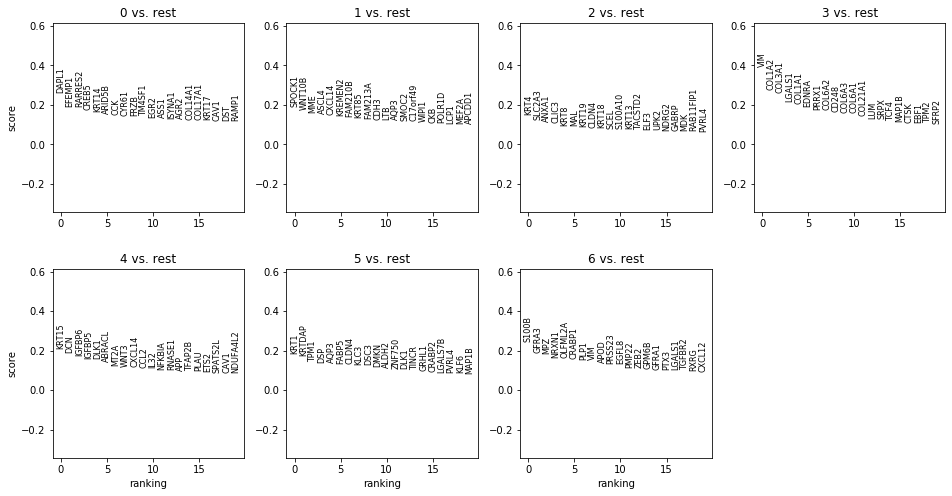

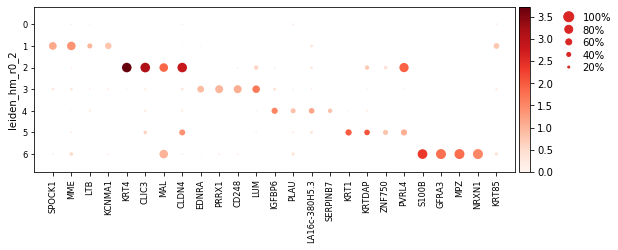

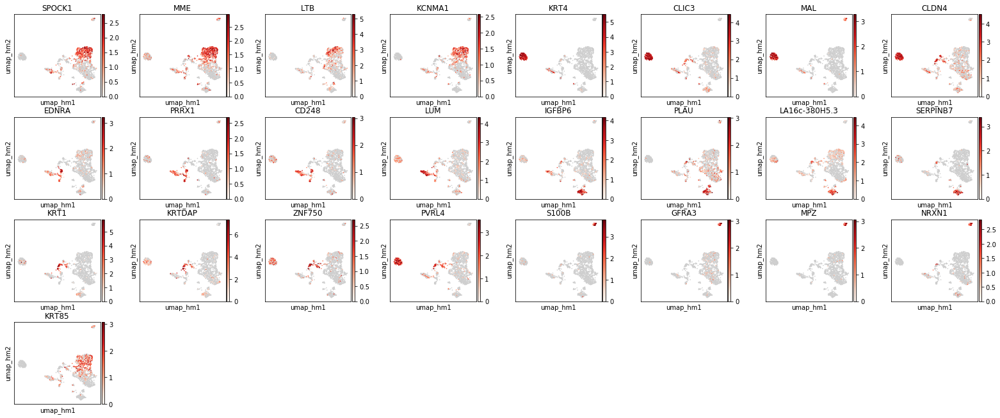

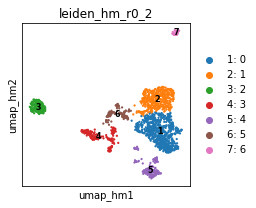

In [59]:
hm_de_genes2 = diffexp(
    ad2, basis='umap', key='hm', res=0.2,
    filter_params={'min_in_group_fraction': 0.4, 'max_out_group_fraction': 0.2, 'min_fold_change': 2},
    extra_genes=['KRT85']
)
hm_de_genes2.groupby('cluster').head(5)

# 4.2 BBKNN

In [35]:
ad1.uns['neighbors'] = ad1.uns['neighbors_orig']
bbknn.bbknn(ad1, batch_key='sample', metric='euclidean', neighbors_within_batch=2, copy=False)
ad1.uns['neighbors_bk'] = ad1.uns['neighbors']
del ad1.uns['neighbors']
ss.lib.umap(ad1, use_graph='neighbors_bk', key_added='bk')

AnnData object with n_obs × n_vars = 1747 × 18593 
    obs: 'bh_doublet_pval', 'cell_caller', 'cluster_scrublet_score', 'doublet_pval', 'mt_prop', 'n_counts', 'n_genes', 'sanger_id', 'scrublet_score', 'chemistry', 'donor', 'gender', 'pcw', 'sorting', 'sample', 'chemistry_sorting', 'annot', 'doublet', 'hierarchy1', 'percent_mito', 'percent_ribo', 'percent_hb', 'leiden_orig_r0_1', 'leiden_orig_r0_2', 'leiden_orig_r0_3', 'leiden_orig_r0_4', 'leiden_hm_r0_1', 'leiden_hm_r0_2', 'leiden_hm_r0_3', 'leiden_hm_r0_4', '__is_in_cluster__', 'leiden_bk_r0_1', 'leiden_bk_r0_2', 'leiden_bk_r0_3', 'leiden_bk_r0_4', 'leiden_bk_r0_5', 'leiden_hm_nocc_r0_1', 'leiden_hm_nocc_r0_2', 'leiden_hm_nocc_r0_3', 'leiden_hm_nocc_r0_4', 'lr_annot', 'leiden_bk_nocc_r0_1', 'leiden_bk_nocc_r0_2', 'leiden_bk_nocc_r0_3', 'leiden_bk_nocc_r0_4', 'rachel_annot1', 'leiden_hm_r3_0', 'scrublet_z', 'cluster_scrublet_z', 'pooled_doublet'
    var: 'gene_ids', 'cc', 'mito', 'ribo', 'hb', 'n_cells', 'highly_variable'
    uns: 'che

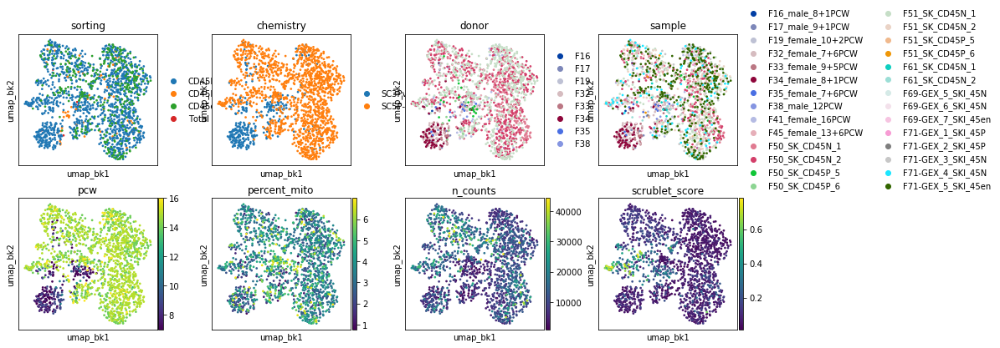

In [36]:
rcParams.update({'figure.figsize':(3,3)})
plot_scatter(ad1, basis='umap_bk',
             color=['sorting', 'chemistry', 'donor', 'sample', 'pcw', 'percent_mito', 'n_counts', 'scrublet_score'],
             size=30)

In [113]:
ss.lib.leiden(ad1, use_graph='neighbors_bk', key_added='bk', resolution=CLUSTER_RESOLUTIONS + [0.6,0.7])

['leiden_bk_r0_1',
 'leiden_bk_r0_2',
 'leiden_bk_r0_3',
 'leiden_bk_r0_4',
 'leiden_bk_r0_5',
 'leiden_bk_r0_6',
 'leiden_bk_r0_7']

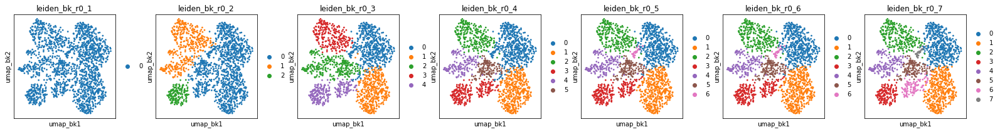

In [114]:
rcParams.update({'figure.figsize':(3,3)})
plot_scatter(ad1, basis='umap_bk', color=[f'leiden_bk_r{str(res).replace(".", "_")}' for res in (0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7)], size=30, ncols=7, )

In [66]:
doublet_freq = ad1.obs.groupby('leiden_bk_r0_3')['doublet'].agg(lambda x: sum(x)/len(x))
p, p_adj = ss.lib.test_outlier(doublet_freq, upper_mad_only=False)
print(pd.DataFrame({'freq': doublet_freq, 'p': p}))

                    freq         p
leiden_bk_r0_3                    
0               0.004132  0.609768
1               0.002532  0.667135
2               0.000000  0.750000
3               0.000000  0.750000
4               0.134615  0.000000
5               0.007042  0.500000
6               0.010989  0.352711
7               0.464286  0.000000
8               0.222222  0.000000


,cluster,ref,rank,genes,scores
18600,1,rest,7,SPOCK1,0.127891
18658,1,rest,65,SHH,0.070373
18724,1,rest,131,LTB,0.061807
37187,2,rest,1,CCNB2,0.226984
37188,2,rest,2,UBE2C,0.215630
37189,2,rest,3,CENPF,0.213185
37193,2,rest,7,NUSAP1,0.187485
37195,2,rest,9,TOP2A,0.173861
55779,3,rest,0,KRT4,0.148071
55782,3,rest,3,CLIC3,0.112920


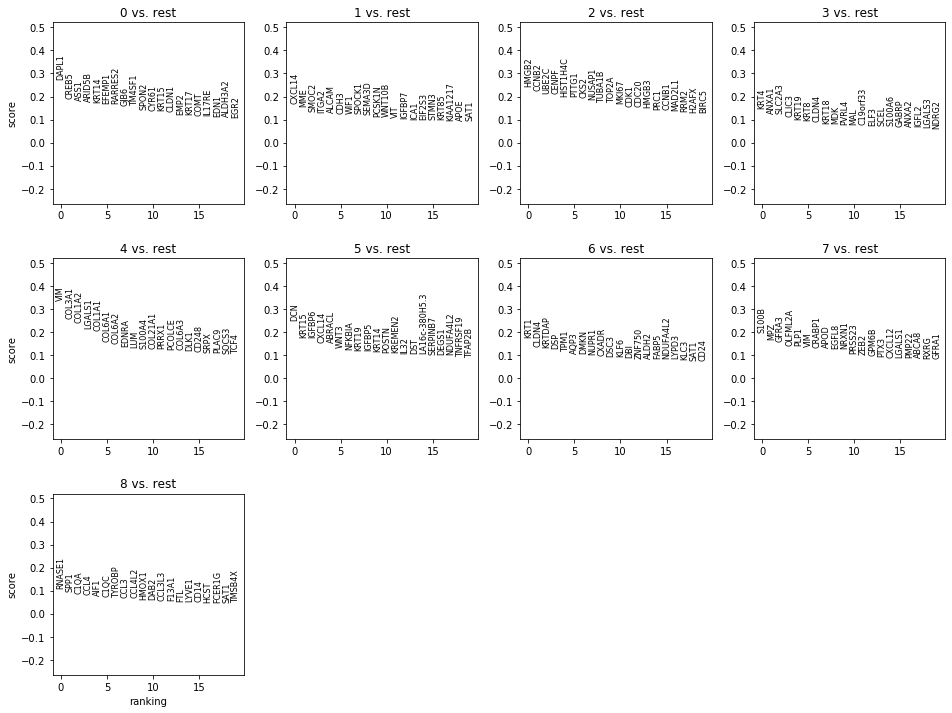

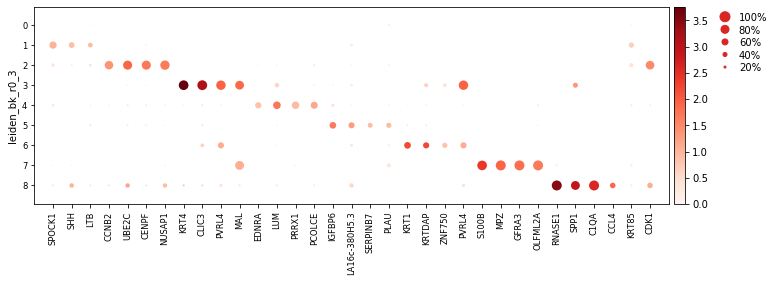

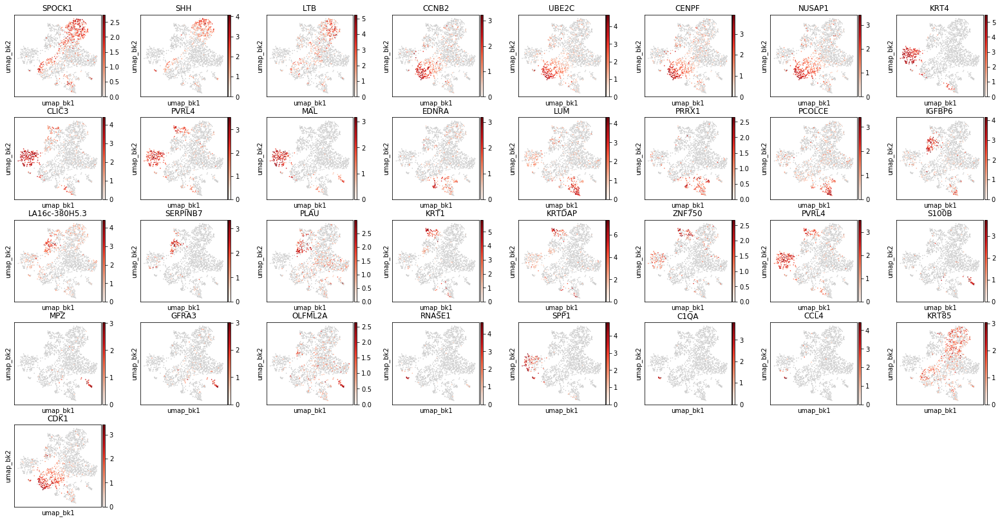

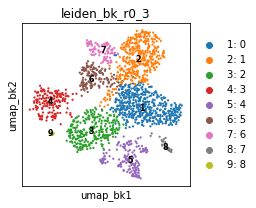

In [67]:
bk_de_genes1 = diffexp(
    ad1, basis='umap', key='bk', res=0.3,
    filter_params={'min_in_group_fraction': 0.4, 'max_out_group_fraction': 0.2, 'min_fold_change': 2},
    extra_genes=['KRT85', 'CDK1']
)
bk_de_genes1.groupby('cluster').head(5)

In [39]:
ad2.uns['neighbors'] = ad2.uns['neighbors_orig']
bbknn.bbknn(ad2, batch_key='sample', metric='euclidean', neighbors_within_batch=2, copy=False)
ad2.uns['neighbors_bk'] = ad2.uns['neighbors']
ss.lib.umap(ad2, use_graph='neighbors_bk', key_added='bk')

AnnData object with n_obs × n_vars = 1747 × 18031 
    obs: 'bh_doublet_pval', 'cell_caller', 'cluster_scrublet_score', 'doublet_pval', 'mt_prop', 'n_counts', 'n_genes', 'sanger_id', 'scrublet_score', 'chemistry', 'donor', 'gender', 'pcw', 'sorting', 'sample', 'chemistry_sorting', 'annot', 'doublet', 'hierarchy1', 'percent_mito', 'percent_ribo', 'percent_hb', 'leiden_orig_r0_1', 'leiden_orig_r0_2', 'leiden_orig_r0_3', 'leiden_orig_r0_4', 'leiden_hm_r0_1', 'leiden_hm_r0_2', 'leiden_hm_r0_3', 'leiden_hm_r0_4', '__is_in_cluster__', 'leiden_bk_r0_1', 'leiden_bk_r0_2', 'leiden_bk_r0_3', 'leiden_bk_r0_4', 'leiden_bk_r0_5', 'lr_annot'
    var: 'gene_ids', 'cc', 'mito', 'ribo', 'hb', 'n_cells', 'highly_variable'
    uns: 'chemistry_colors', 'donor_colors', 'leiden', 'leiden_bk_r0_1_colors', 'leiden_bk_r0_2_colors', 'leiden_bk_r0_3_colors', 'leiden_bk_r0_4_colors', 'leiden_bk_r0_5_colors', 'leiden_hm_r0_1_colors', 'leiden_hm_r0_2_colors', 'leiden_hm_r0_3_colors', 'leiden_hm_r0_4_colors', 'leide

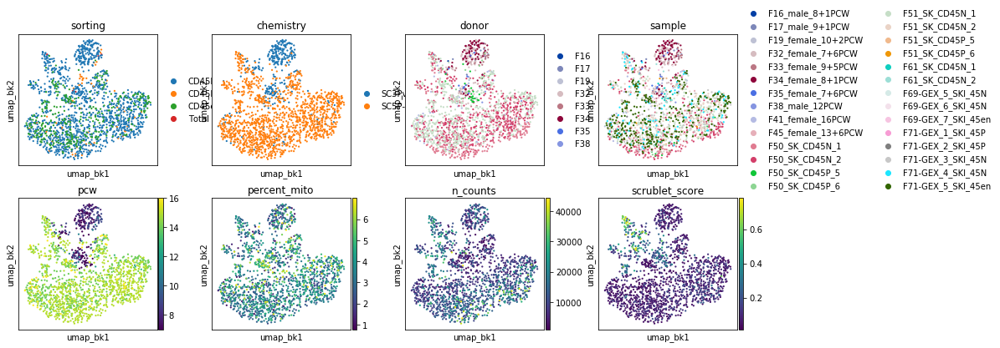

In [40]:
rcParams.update({'figure.figsize':(3,3)})
plot_scatter(ad2, basis='umap_bk',
             color=['sorting', 'chemistry', 'donor', 'sample', 'pcw', 'percent_mito', 'n_counts', 'scrublet_score'],
             size=20)

In [115]:
ss.lib.leiden(ad2, use_graph='neighbors_bk', key_added='bk', resolution=CLUSTER_RESOLUTIONS+[0.6, 0.7])

['leiden_bk_r0_1',
 'leiden_bk_r0_2',
 'leiden_bk_r0_3',
 'leiden_bk_r0_4',
 'leiden_bk_r0_5',
 'leiden_bk_r0_6',
 'leiden_bk_r0_7']

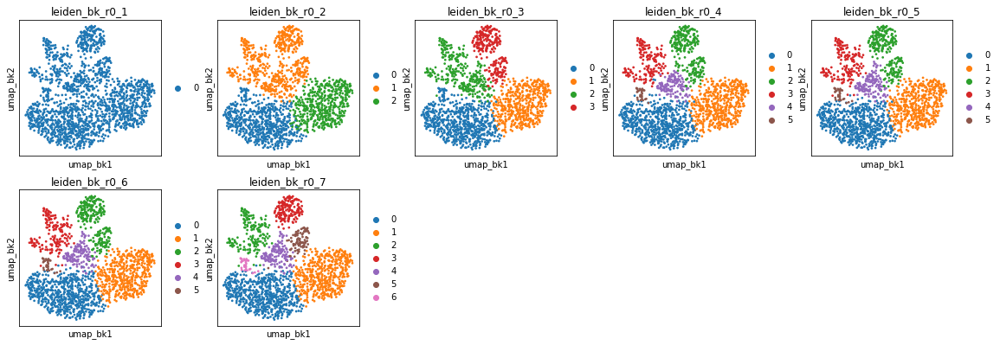

In [116]:
rcParams.update({'figure.figsize':(3,3)})
plot_scatter(
    ad2, basis='umap_bk',
    color=[f'leiden_bk_r{str(res).replace(".", "_")}' for res in (0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7)], size=30, ncols=5)

In [74]:
doublet_freq = ad2.obs.groupby('leiden_bk_r0_4')['doublet'].agg(lambda x: sum(x)/len(x))
p, p_adj = ss.lib.test_outlier(doublet_freq, upper_mad_only=False)
print(pd.DataFrame({'freq': doublet_freq, 'p': p}))

                    freq         p
leiden_bk_r0_4                    
0               0.003263  0.676649
1               0.002037  0.717834
2               0.119318  0.000000
3               0.000000  0.780109
4               0.007194  0.531766
5               0.008850  0.468234
6               0.382353  0.000000
7               0.222222  0.000000


In [75]:
doublet_freq = ad2.obs.groupby('leiden_bk_r0_4')['scrublet_score'].agg(lambda x: sum(x)/len(x))
p, p_adj = ss.lib.test_outlier(doublet_freq, upper_mad_only=False)
print(pd.DataFrame({'score': doublet_freq, 'p': p}))

                   score         p
leiden_bk_r0_4                    
0               0.076062  0.763369
1               0.098944  0.628601
2               0.334265  0.000120
3               0.081743  0.732566
4               0.137545  0.371399
5               0.081084  0.736241
6               0.218147  0.044703
7               0.288971  0.001850


,cluster,ref,rank,genes,scores
9,0,rest,9,SPON2,0.170349
23,0,rest,23,CALB2,0.118922
18034,1,rest,3,SPOCK1,0.167384
18036,1,rest,5,KCNMA1,0.161999
18040,1,rest,9,MME,0.123339
18058,1,rest,27,LTB,0.095833
18215,1,rest,184,SHH,0.053952
36067,2,rest,5,EDNRA,0.177005
36071,2,rest,9,PRRX1,0.158824
36074,2,rest,12,CD248,0.135876


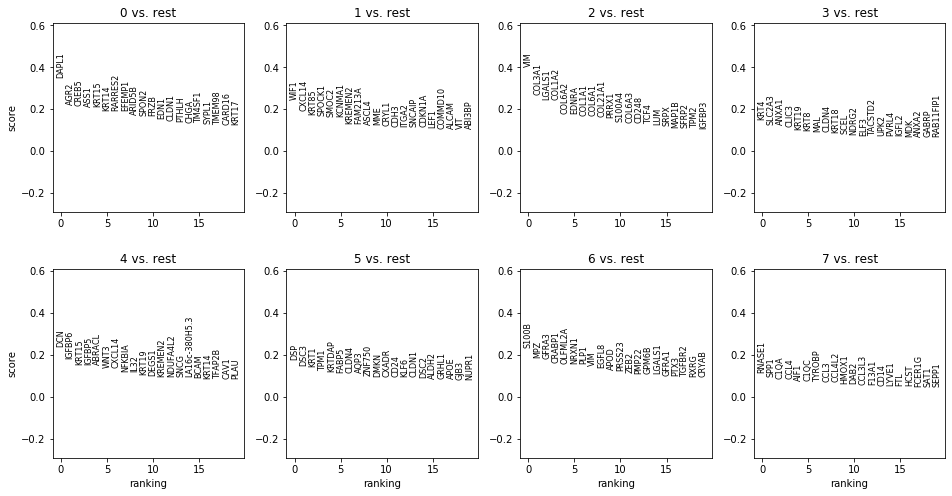

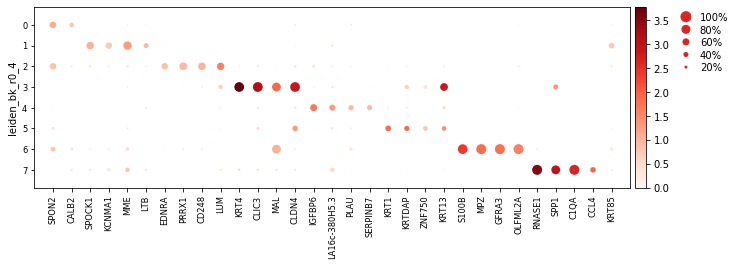

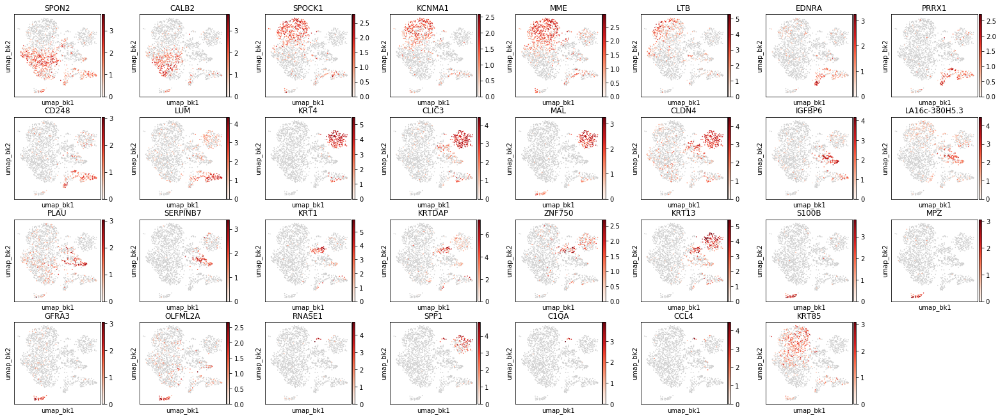

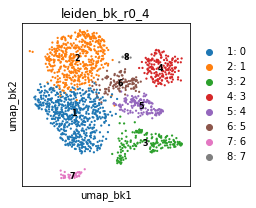

In [76]:
bk_de_genes2 = diffexp(
    ad2, basis='umap', key='bk', res=0.4,
    filter_params={'min_in_group_fraction': 0.4, 'max_out_group_fraction': 0.2, 'min_fold_change': 2},
    extra_genes=['KRT85']
)
bk_de_genes2.groupby('cluster').head(5)

# 5. Compare clustering

In [208]:
adt = ad1.copy()
adt.obs['leiden_orig_nocc_r0_3'] = ad2.obs['leiden_orig_r0_3']
adt.obs['leiden_hm_nocc_r0_2'] = ad2.obs['leiden_hm_r0_2']
adt.obs['leiden_bk_nocc_r0_4'] = ad2.obs['leiden_bk_r0_4']

In [209]:
adt.obsm['X_umap_nocc_orig'] = ad2.obsm['X_umap_orig']
adt.obsm['X_umap_nocc_hm'] = ad2.obsm['X_umap_hm']
adt.obsm['X_umap_nocc_bk'] = ad2.obsm['X_umap_bk']

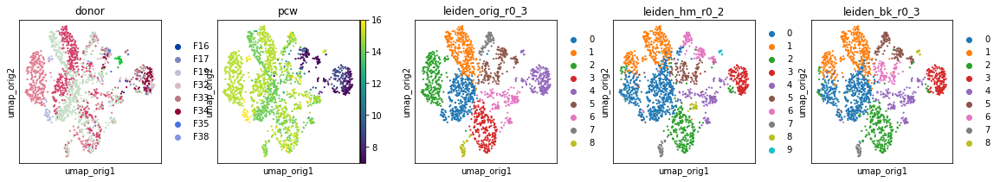

In [210]:
plot_scatter(
    adt, basis='umap_orig',
    color=['donor', 'pcw', 'leiden_orig_r0_3', 'leiden_hm_r0_2', 'leiden_bk_r0_3'], ncols=5, size=20)

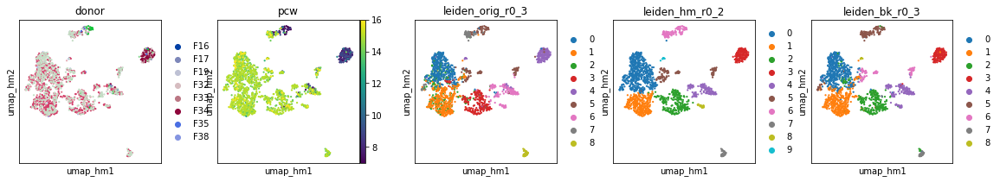

In [211]:
plot_scatter(
    adt, basis='umap_hm',
    color=['donor', 'pcw', 'leiden_orig_r0_3', 'leiden_hm_r0_2', 'leiden_bk_r0_3'], ncols=5, size=20)

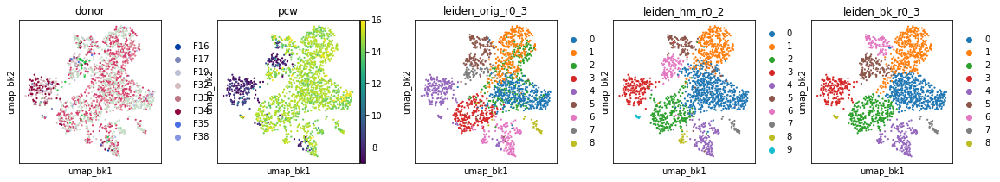

In [212]:
plot_scatter(
    adt, basis='umap_bk',
    color=['donor', 'pcw', 'leiden_orig_r0_3', 'leiden_hm_r0_2', 'leiden_bk_r0_3'], ncols=5, size=20)

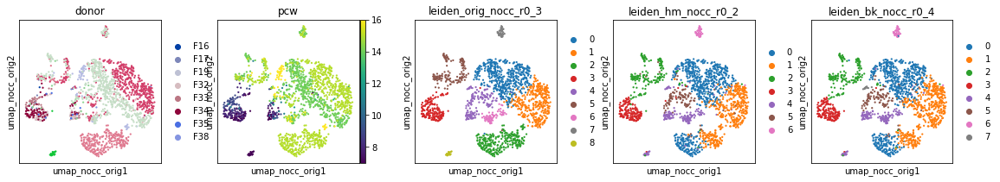

In [213]:
plot_scatter(
    adt, basis='umap_nocc_orig',
    color=['donor', 'pcw', 'leiden_orig_nocc_r0_3', 'leiden_hm_nocc_r0_2', 'leiden_bk_nocc_r0_4'], ncols=5, size=20)

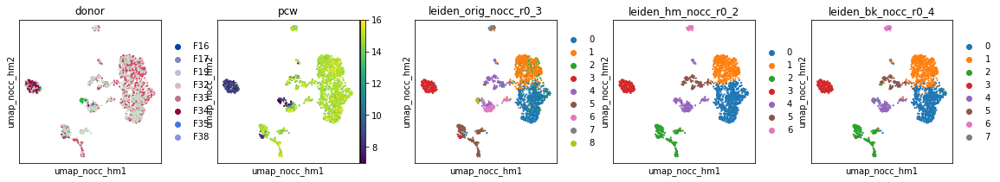

In [214]:
plot_scatter(
    adt, basis='umap_nocc_hm',
    color=['donor', 'pcw', 'leiden_orig_nocc_r0_3', 'leiden_hm_nocc_r0_2', 'leiden_bk_nocc_r0_4'], ncols=5, size=20)

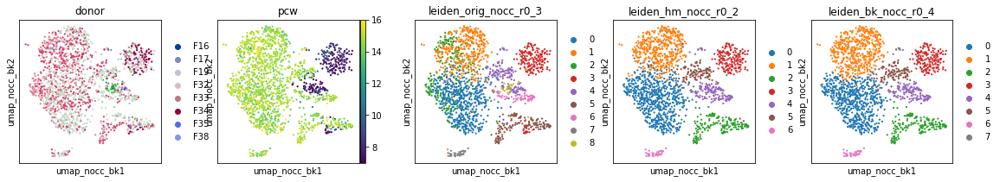

In [215]:
plot_scatter(
    adt, basis='umap_nocc_bk',
    color=['donor', 'pcw', 'leiden_orig_nocc_r0_3', 'leiden_hm_nocc_r0_2', 'leiden_bk_nocc_r0_4'], ncols=5, size=20)

In [216]:
ss.lib.cross_table(adt, 'leiden_orig_nocc_r0_3', 'leiden_orig_r0_3', highlight=True)

leiden_orig_r0_3,0,1,2,3,4,5,6,7,8
leiden_orig_nocc_r0_3,,,,,,,,,
0,345,27,4,104,0,1,6,1,0
1,4,287,1,68,0,0,0,0,0
2,1,0,241,37,0,0,0,0,0
3,1,0,0,0,187,0,0,0,0
4,1,6,0,2,9,138,0,0,0
5,0,0,1,13,0,0,136,0,0
6,2,0,1,1,0,1,0,66,0
7,0,0,0,0,0,0,0,0,34
8,0,0,0,0,0,21,0,0,0


In [217]:
ss.lib.cross_table(adt, 'leiden_hm_nocc_r0_2', 'leiden_hm_r0_2', highlight=True)

leiden_hm_r0_2,0,1,2,3,4,5,6,7,8,9
leiden_hm_nocc_r0_2,,,,,,,,,,
0,511,5,128,0,0,5,0,0,0,0
1,38,314,86,0,0,4,0,0,0,0
2,2,0,20,0,134,0,0,0,22,0
3,0,0,12,159,0,2,0,0,0,0
4,20,1,5,0,0,1,118,0,0,10
5,1,0,3,1,0,109,0,0,1,0
6,0,0,1,0,0,0,0,34,0,0


In [218]:
ss.lib.cross_table(adt, 'leiden_bk_nocc_r0_4', 'leiden_bk_r0_3', highlight=True)

leiden_bk_r0_3,0,1,2,3,4,5,6,7,8
leiden_bk_nocc_r0_4,,,,,,,,,
0,455,7,143,0,1,6,1,0,0
1,19,378,91,0,0,2,1,0,0
2,0,0,21,0,155,0,0,0,0
3,0,0,6,166,0,0,0,0,0
4,0,0,6,0,0,132,1,0,0
5,10,10,3,0,0,2,88,0,0
6,0,0,6,0,0,0,0,28,0
7,0,0,0,0,0,0,0,0,9


In [219]:
ss.lib.cross_table(adt, 'leiden_bk_r0_3', 'leiden_orig_r0_3', highlight=True)

leiden_orig_r0_3,0,1,2,3,4,5,6,7,8
leiden_bk_r0_3,,,,,,,,,
0,330,30,116,2,0,5,0,0,1
1,2,280,110,1,0,2,0,0,0
2,11,0,18,222,7,6,7,0,5
3,1,0,0,0,164,1,0,0,0
4,2,0,1,0,16,2,135,0,0
5,4,4,3,0,0,64,0,67,0
6,4,6,0,0,0,81,0,0,0
7,0,0,0,0,0,0,0,0,28
8,0,0,0,0,9,0,0,0,0


In [220]:
ss.lib.cross_table(adt, 'leiden_bk_r0_3', 'leiden_hm_r0_2', highlight=True)

leiden_hm_r0_2,0,1,2,3,4,5,6,7,8,9
leiden_bk_r0_3,,,,,,,,,,
0,466,1,3,0,1,11,1,1,0,0
1,49,317,13,1,0,14,0,0,0,1
2,33,1,231,0,3,0,2,5,1,0
3,0,0,6,158,2,0,0,0,0,0
4,2,0,2,0,127,3,0,0,22,0
5,22,1,0,0,1,3,115,0,0,0
6,0,0,0,1,0,90,0,0,0,0
7,0,0,0,0,0,0,0,28,0,0
8,0,0,0,0,0,0,0,0,0,9


In [221]:
ss.lib.cross_table(adt, 'leiden_bk_nocc_r0_4', 'leiden_hm_nocc_r0_2', highlight=True)

leiden_hm_nocc_r0_2,0,1,2,3,4,5,6
leiden_bk_nocc_r0_4,,,,,,,
0,594,8,6,0,3,1,1
1,50,431,0,0,4,6,0
2,1,0,170,0,1,4,0
3,0,0,2,170,0,0,0
4,0,0,0,0,137,2,0
5,4,3,0,3,1,102,0
6,0,0,0,0,0,0,34
7,0,0,0,0,9,0,0


In [222]:
ss.lib.cross_table(adt, 'leiden_bk_nocc_r0_4', 'leiden_orig_nocc_r0_3', highlight=True)

leiden_orig_nocc_r0_3,0,1,2,3,4,5,6,7,8
leiden_bk_nocc_r0_4,,,,,,,,,
0,447,11,147,0,3,1,3,1,0
1,25,340,124,0,2,0,0,0,0
2,6,1,1,17,0,149,0,0,2
3,0,0,0,171,0,0,0,0,1
4,3,1,0,0,49,0,68,0,18
5,7,6,7,0,93,0,0,0,0
6,0,1,0,0,0,0,0,33,0
7,0,0,0,0,9,0,0,0,0


In [43]:
ad1.write('data/h5ad/fetal_skin_hierarch1_keratinocytes_processed.h5ad', compression='lzf')
ad2.write('data/h5ad/fetal_skin_hierarch1_keratinocytes_processed_nocc.h5ad', compression='lzf')

In [ ]:
ad1 = sc.read('data/h5ad/fetal_skin_hierarch1_keratinocytes_processed.h5ad')
ad2 = sc.read('data/h5ad/fetal_skin_hierarch1_keratinocytes_processed_nocc.h5ad')

In [78]:
ad1.obsm['X_umap_hm_nocc'] = ad2.obsm['X_umap_hm']
for r in (1,2,3,4):
    ad1.obs[f'leiden_hm_nocc_r0_{r}'] = ad2.obs[f'leiden_hm_r0_{r}']

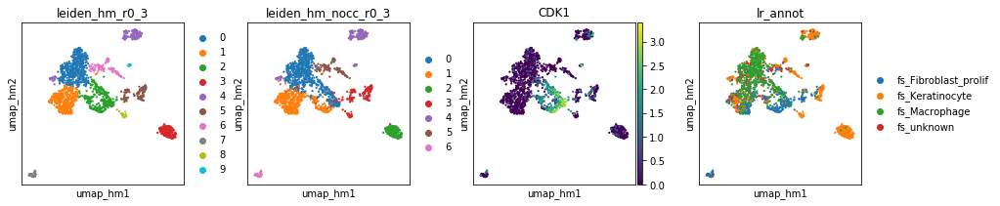

In [107]:
ss.lib.set_figsize((3,3))
plot_scatter(ad1, basis='umap_hm', color=['leiden_hm_r0_3', 'leiden_hm_nocc_r0_3', 'CDK1', 'lr_annot'], size=20)

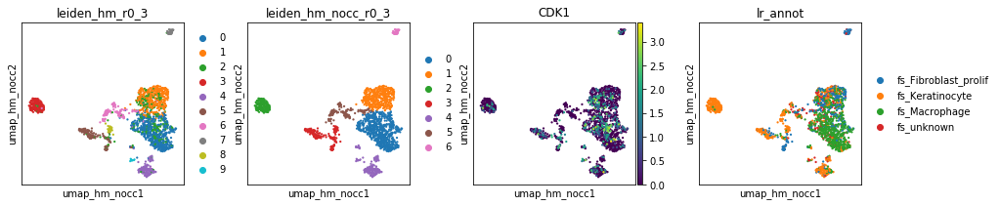

In [108]:
ss.lib.set_figsize((3,3))
plot_scatter(ad1, basis='umap_hm_nocc', color=['leiden_hm_r0_3', 'leiden_hm_nocc_r0_3', 'CDK1', 'lr_annot'], size=20)

# 6. Incorporate annotation

In [44]:
ad1 = sc.read(f'data/h5ad/fetal_skin_hierarch1_{CATEGORY_NAME}_processed.h5ad')
ad2 = sc.read(f'data/h5ad/fetal_skin_hierarch1_{CATEGORY_NAME}_processed_nocc.h5ad')
ad1.uns['neighbors_hm_nocc'] = ad2.uns['neighbors_hm']
ad1.uns['neighbors_bk_nocc'] = ad2.uns['neighbors_bk']

In [117]:
ad1.obsm['X_umap_hm_nocc'] = ad2.obsm['X_umap_hm']
ad1.obsm['X_umap_bk_nocc'] = ad2.obsm['X_umap_bk']
for res in CLUSTER_RESOLUTIONS:
    r = str(res).replace(".", "_")
    ad1.obs[f'leiden_hm_nocc_r{r}'] = ad2.obs[f'leiden_hm_r{r}']
    ad1.obs[f'leiden_bk_nocc_r{r}'] = ad2.obs[f'leiden_bk_r{r}']
ad1.obs[f'leiden_bk_nocc_r0_7'] = ad2.obs[f'leiden_bk_r0_7']

In [12]:
ad1.obs['rachel_annot1'] = ad1.obs['leiden_hm_r0_2'].cat.rename_categories({
    '0': 'KRT5+KRT15+ KC',
    '1': 'KRT85+ KC',
    '2': 'Proliferating KC',
    '3': 'Pericytes',
    '4': 'Suprabasal KC',
    '5': 'Doublets/Fibroblasts',
    '6': 'SOX6+ basal KC',
    '7': 'Schwann cells/neuronal',
    '8': 'Doublets/Macrophages'
})

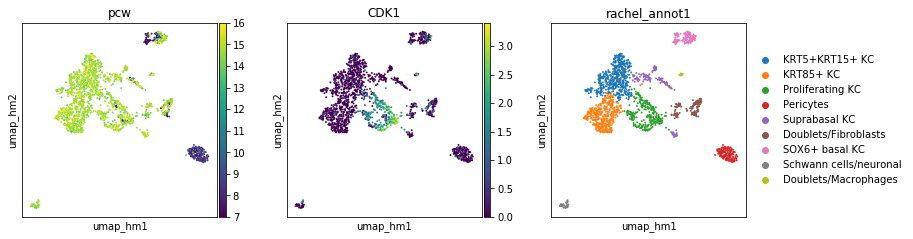

In [104]:
ss.lib.set_figsize((3.5, 3.5))
plot_scatter(ad1, basis='umap_hm', color=['pcw', 'CDK1', 'rachel_annot1'], size=15)

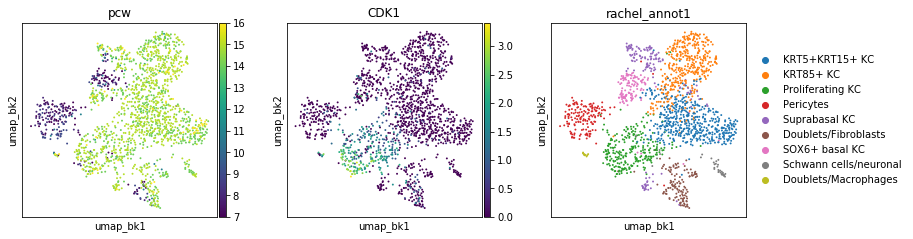

In [14]:
plot_scatter(ad1, basis='umap_bk', color=['pcw', 'CDK1', 'rachel_annot1'], size=15)

In [15]:
ss.lib.cross_table(ad1, 'annot', 'rachel_annot1', highlight=True)

rachel_annot1,KRT5+KRT15+ KC,KRT85+ KC,Proliferating KC,Pericytes,Suprabasal KC,Doublets/Fibroblasts,SOX6+ basal KC,Schwann cells/neuronal,Doublets/Macrophages
annot,,,,,,,,,
fs_Fibroblast_prolif,0,0,2,0,0,0,0,0,0
fs_Keratinocyte,23,16,21,144,21,7,37,0,2
fs_Macrophage,0,0,0,0,0,0,0,0,2
fs_unknown,0,0,0,0,0,0,1,0,1
nan,475,369,244,19,121,123,80,34,5


# 7. Over-cluster to remove doublet

In [16]:
ad1

AnnData object with n_obs × n_vars = 1747 × 18593 
    obs: 'bh_doublet_pval', 'cell_caller', 'cluster_scrublet_score', 'doublet_pval', 'mt_prop', 'n_counts', 'n_genes', 'sanger_id', 'scrublet_score', 'chemistry', 'donor', 'gender', 'pcw', 'sorting', 'sample', 'chemistry_sorting', 'annot', 'doublet', 'hierarchy1', 'percent_mito', 'percent_ribo', 'percent_hb', 'leiden_orig_r0_1', 'leiden_orig_r0_2', 'leiden_orig_r0_3', 'leiden_orig_r0_4', 'leiden_hm_r0_1', 'leiden_hm_r0_2', 'leiden_hm_r0_3', 'leiden_hm_r0_4', '__is_in_cluster__', 'leiden_bk_r0_1', 'leiden_bk_r0_2', 'leiden_bk_r0_3', 'leiden_bk_r0_4', 'leiden_bk_r0_5', 'leiden_hm_nocc_r0_1', 'leiden_hm_nocc_r0_2', 'leiden_hm_nocc_r0_3', 'leiden_hm_nocc_r0_4', 'lr_annot', 'leiden_bk_nocc_r0_1', 'leiden_bk_nocc_r0_2', 'leiden_bk_nocc_r0_3', 'leiden_bk_nocc_r0_4', 'rachel_annot1'
    var: 'gene_ids', 'cc', 'mito', 'ribo', 'hb', 'n_cells', 'highly_variable'
    uns: 'chemistry_colors', 'donor_colors', 'leiden', 'leiden_bk_r0_1_colors', 'leid

In [17]:
ss.lib.leiden(ad1, use_graph='neighbors_hm', resolution=[3.0], key_added='hm')

['leiden_hm_r3_0']

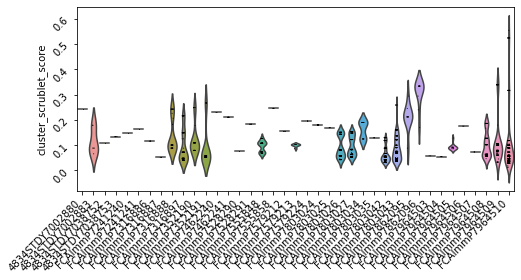

In [18]:
ss.lib.set_figsize((7, 3.5))
sc.pl.violin(ad1, keys='cluster_scrublet_score', groupby='sanger_id', rotation=45)

In [19]:
ad1.obs['scrublet_z'] = ad1.obs.groupby('sanger_id')['scrublet_score'].apply(lambda x: ss.lib.test_outlier(x, robust=True, upper_mad_only=True)[0])
ad1.obs['cluster_scrublet_z'] = ad1.obs.groupby('sanger_id')['cluster_scrublet_score'].apply(lambda x: ss.lib.test_outlier(x, robust=True, upper_mad_only=True)[0])

In [20]:
ad1.obs['cluster_scrublet_z'].describe()

count    1747.000000
mean        0.270275
std         1.255663
min        -1.443768
25%        -0.303462
50%         0.000000
75%         0.674491
max        10.593790
Name: cluster_scrublet_z, dtype: float64

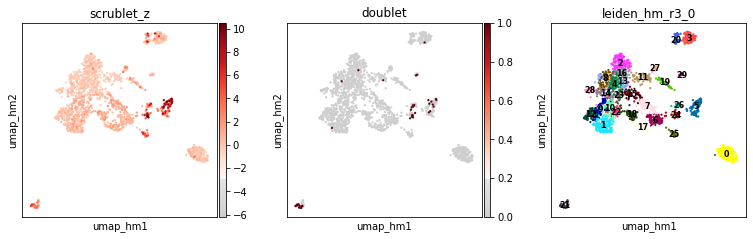

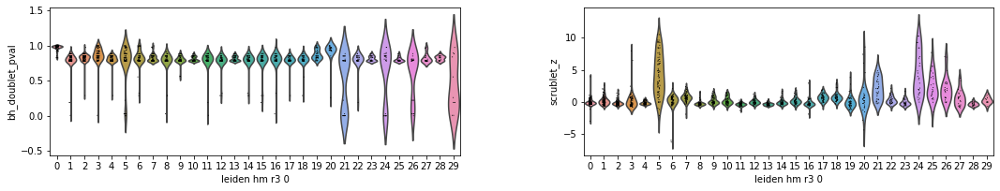

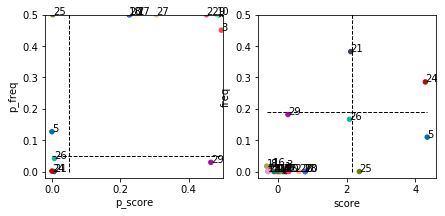

In [21]:
df = check_doublets(ad1, 'leiden_hm_r3_0', basis='umap_hm', p='bh_doublet_pval', score='scrublet_z', initial_pmin=0.05, size=20)

In [22]:
ad1.obs['pooled_doublet'] = ad1.obs['leiden_hm_r3_0'].isin(['5', '21', '24', '25', '26', '29'])

In [23]:
ad1.write(f'data/h5ad/fetal_skin_hierarch1_{CATEGORY_NAME}_processed.h5ad', compression='lzf')

# 8. Trajectory

In [119]:
ad1n = ad1[~ad1.obs['pooled_doublet'], :]

In [120]:
ad1n

View of AnnData object with n_obs × n_vars = 1543 × 18593 
    obs: 'bh_doublet_pval', 'cell_caller', 'cluster_scrublet_score', 'doublet_pval', 'mt_prop', 'n_counts', 'n_genes', 'sanger_id', 'scrublet_score', 'chemistry', 'donor', 'gender', 'pcw', 'sorting', 'sample', 'chemistry_sorting', 'annot', 'doublet', 'hierarchy1', 'percent_mito', 'percent_ribo', 'percent_hb', 'leiden_orig_r0_1', 'leiden_orig_r0_2', 'leiden_orig_r0_3', 'leiden_orig_r0_4', 'leiden_hm_r0_1', 'leiden_hm_r0_2', 'leiden_hm_r0_3', 'leiden_hm_r0_4', '__is_in_cluster__', 'leiden_bk_r0_1', 'leiden_bk_r0_2', 'leiden_bk_r0_3', 'leiden_bk_r0_4', 'leiden_bk_r0_5', 'leiden_hm_nocc_r0_1', 'leiden_hm_nocc_r0_2', 'leiden_hm_nocc_r0_3', 'leiden_hm_nocc_r0_4', 'lr_annot', 'leiden_bk_nocc_r0_1', 'leiden_bk_nocc_r0_2', 'leiden_bk_nocc_r0_3', 'leiden_bk_nocc_r0_4', 'rachel_annot1', 'leiden_hm_r3_0', 'scrublet_z', 'cluster_scrublet_z', 'pooled_doublet', 'leiden_hm_r0_5', 'leiden_hm_nocc_r0_5', 'leiden_bk_nocc_r0_5', 'leiden_bk_r0_6', 

In [124]:
ad1n_1 = ad1n.copy()[(~ad1n.obs.leiden_hm_nocc_r0_2.isin(['3', '6'])) & (~ad1n.obs.leiden_bk_r0_7.isin(['4'])), :]
# ad1n_1 = ad1n.copy()

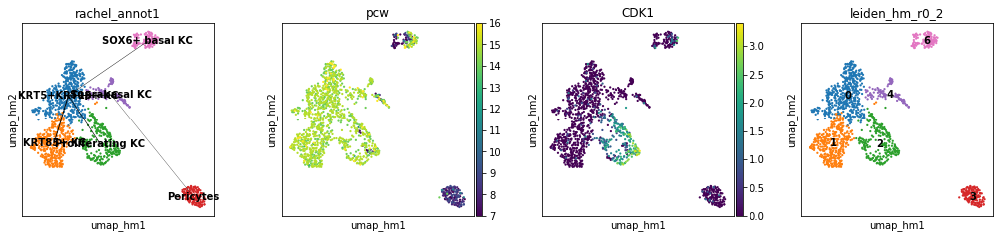

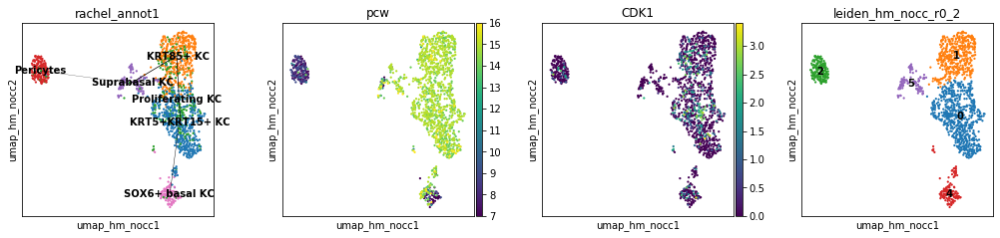

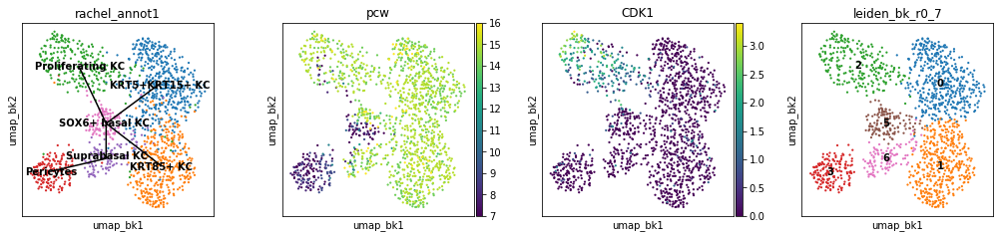

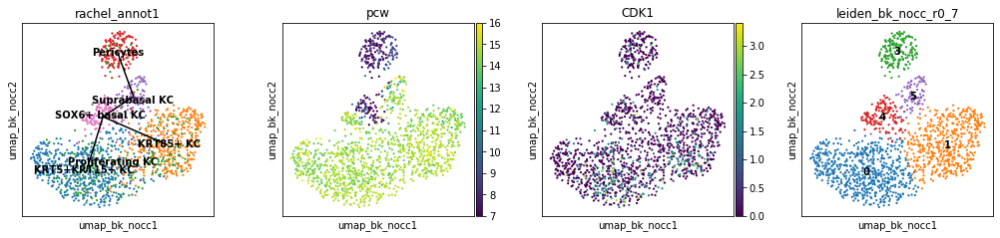

In [125]:
ss.lib.set_figsize((3.5, 3.5))

ss.lib.paga(ad1n_1, use_graph='neighbors_hm', key_added='hm', groups='leiden_hm_r0_2')
ss.lib.plot_paga(ad1n_1, basis='umap_hm', use_key='paga_hm', layout='fa', color=['rachel_annot1', 'pcw', 'CDK1', 'leiden_hm_r0_2'],
                 edge_width_scale=1, solid_edges='connectivities_tree', size=20)

ss.lib.paga(ad1n_1, use_graph='neighbors_hm_nocc', key_added='hm_nocc', groups='leiden_hm_nocc_r0_2')
ss.lib.plot_paga(ad1n_1, basis='umap_hm_nocc', use_key='paga_hm_nocc', layout='fa', color=['rachel_annot1', 'pcw', 'CDK1', 'leiden_hm_nocc_r0_2'],
                 edge_width_scale=1, solid_edges='connectivities_tree', size=20)

ss.lib.paga(ad1n_1, use_graph='neighbors_bk', key_added='bk', groups='leiden_bk_r0_7')
ss.lib.plot_paga(ad1n_1, basis='umap_bk', use_key='paga_bk', layout='fa', color=['rachel_annot1', 'pcw', 'CDK1', 'leiden_bk_r0_7'],
                 edge_width_scale=0.2, solid_edges='connectivities_tree', size=20)

ss.lib.paga(ad1n_1, use_graph='neighbors_bk_nocc', key_added='bk_nocc', groups='leiden_bk_nocc_r0_7')
ss.lib.plot_paga(ad1n_1, basis='umap_bk_nocc', use_key='paga_bk_nocc', layout='fa', color=['rachel_annot1', 'pcw', 'CDK1', 'leiden_bk_nocc_r0_7'],
                 root=4, edge_width_scale=0.2, solid_edges='connectivities_tree', size=20)

In [131]:
# ad1n_2 = ad1n_1.copy()[(ad1n_1.obs.rachel_annot1 != 'Pericytes'), :]
ad1n_2 = ad1n_1.copy()[(ad1n_1.obs.rachel_annot1 != 'Pericytes') & (~ad1n_1.obs.leiden_hm_nocc_r0_2.isin(['2'])), :]

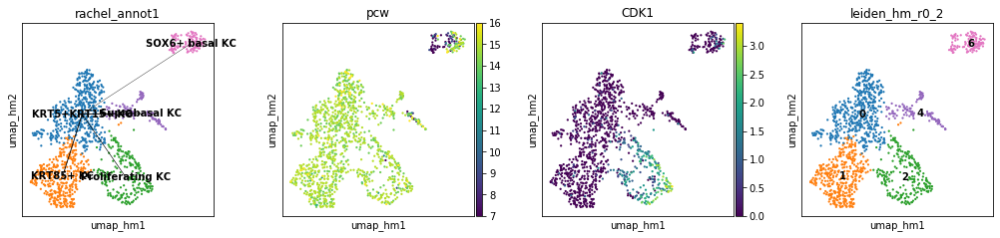

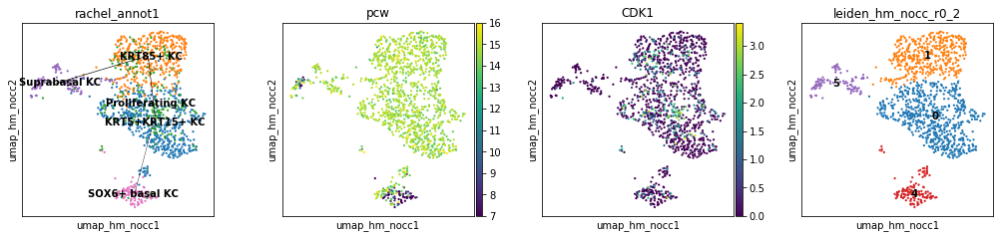

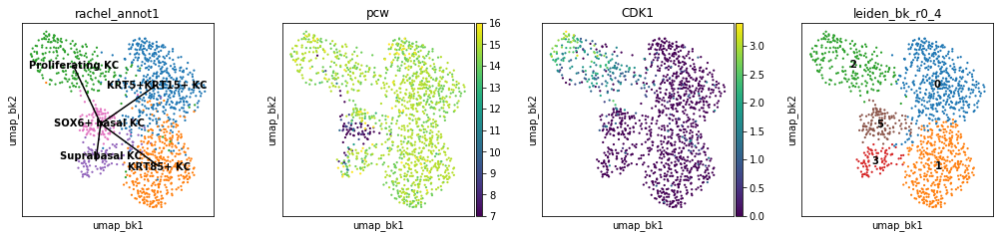

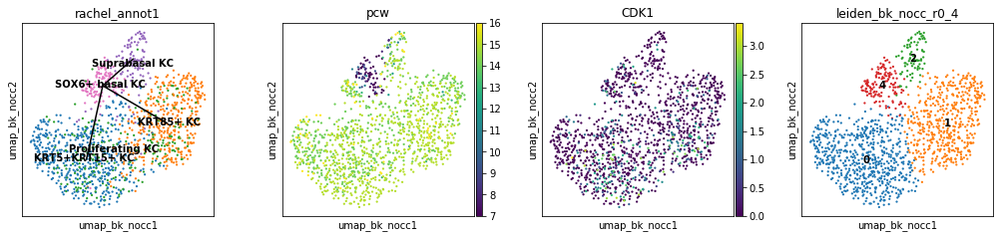

In [132]:
ss.lib.set_figsize((3.5, 3.5))

ss.lib.paga(ad1n_2, use_graph='neighbors_hm', key_added='hm', groups='leiden_hm_r0_2')
ss.lib.plot_paga(ad1n_2, basis='umap_hm', use_key='paga_hm', layout='fa', color=['rachel_annot1', 'pcw', 'CDK1', 'leiden_hm_r0_2'],
                 edge_width_scale=1, solid_edges='connectivities_tree', size=20)

ss.lib.paga(ad1n_2, use_graph='neighbors_hm_nocc', key_added='hm_nocc', groups='leiden_hm_nocc_r0_2')
ss.lib.plot_paga(ad1n_2, basis='umap_hm_nocc', use_key='paga_hm_nocc', layout='fa', color=['rachel_annot1', 'pcw', 'CDK1', 'leiden_hm_nocc_r0_2'],
                 edge_width_scale=1, solid_edges='connectivities_tree', size=20)

ss.lib.paga(ad1n_2, use_graph='neighbors_bk', key_added='bk', groups='leiden_bk_r0_4')
ss.lib.plot_paga(ad1n_2, basis='umap_bk', use_key='paga_bk', layout='fa', color=['rachel_annot1', 'pcw', 'CDK1', 'leiden_bk_r0_4'],
                 edge_width_scale=0.2, solid_edges='connectivities_tree', size=20)

ss.lib.paga(ad1n_2, use_graph='neighbors_bk_nocc', key_added='bk_nocc', groups='leiden_bk_nocc_r0_4')
ss.lib.plot_paga(ad1n_2, basis='umap_bk_nocc', use_key='paga_bk_nocc', layout='fa', color=['rachel_annot1', 'pcw', 'CDK1', 'leiden_bk_nocc_r0_4'],
                 root=4, edge_width_scale=0.2, solid_edges='connectivities_tree', size=20)

In [55]:
ad1n.write(f'data/h5ad/fetal_skin_hierarch1_{CATEGORY_NAME}_processed_nodoublet_paga.h5ad', compression='lzf')